In [1]:
%pylab inline
import seaborn as sns; sns.set_style('darkgrid')
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.figsize'] = 19, 14
sns.set_context('poster', font_scale=1.4)
import KDEpy
import pandas as pd
from scipy.stats import iqr
from warnings import filterwarnings
filterwarnings('ignore')
import pickle

Populating the interactive namespace from numpy and matplotlib


## Load in datasets

P.S. The following cell will consume around 28 GBs of memory

In [2]:
#df1 = pd.read_parquet('/global/projecta/projectdirs/lsst/groups/PZ/PhotoZDC2/COSMODC2v1.1.4/10_year_error_estimates/OLIVIA_WORK/final-result.parquet')
df2 = pd.read_parquet('/global/cfs/cdirs/lsst/groups/PZ/PhotoZDC2/COSMODC2v1.1.4/FZBOOST_SAMPLE/FlexZBoost_random_sample_0_1.parquet')
df3 = pd.read_parquet('/global/cfs/cdirs/lsst/groups/PZ/PhotoZDC2/COSMODC2v1.1.4/FZBOOST_SAMPLE/FlexZBoost_random_sample_1_2.parquet')
df4 = pd.read_parquet('/global/cfs/cdirs/lsst/groups/PZ/PhotoZDC2/COSMODC2v1.1.4/FZBOOST_SAMPLE/FlexZBoost_random_sample_2_3.parquet')
df2 = pd.concat((df2, df3, df4)).reset_index()
#bpz = pd.read_hdf('/global/cscratch1/sd/husni/subsample_bpz.hdf5', key='Bin_8')
#for b in ['Bin_'+str(i) for i in range(1,9)]:
#    bpz = pd.concat((bpz, pd.read_hdf('/global/cscratch1/sd/husni/subsample_bpz.hdf5', key=b))).reset_index()

## Visualize Datasets

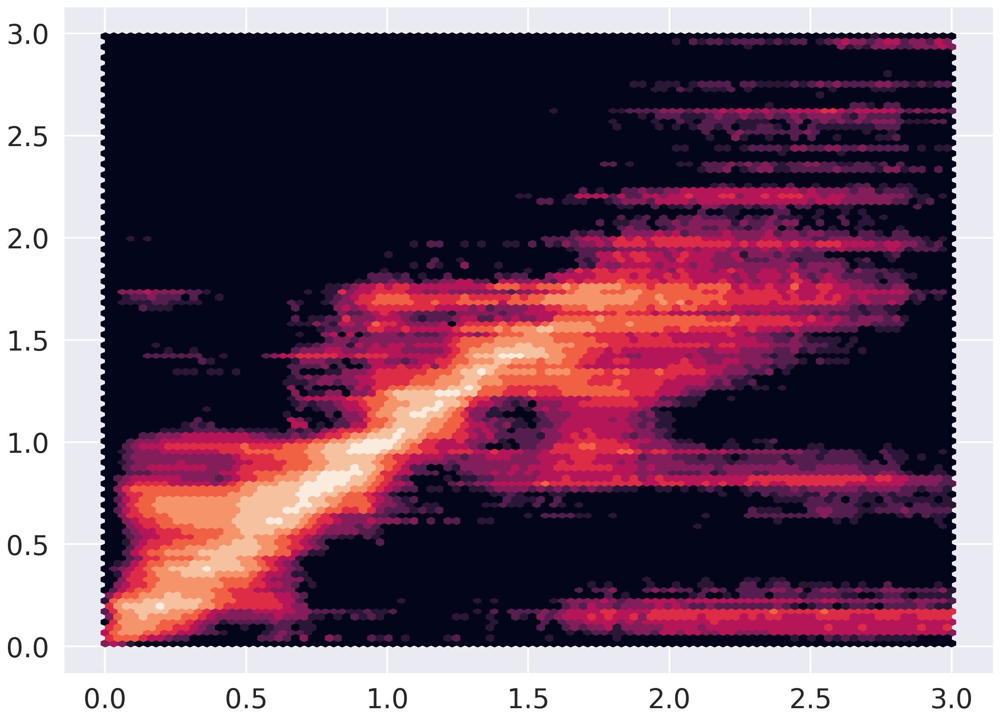

In [77]:
plt.hexbin(df1['rz_real'], df1['photoz_mode'], bins=np.logspace(0, 5, 10))

In [6]:
max(df2['redshift'])

3.1344111854044394

Text(0, 0.5, 'photoz')

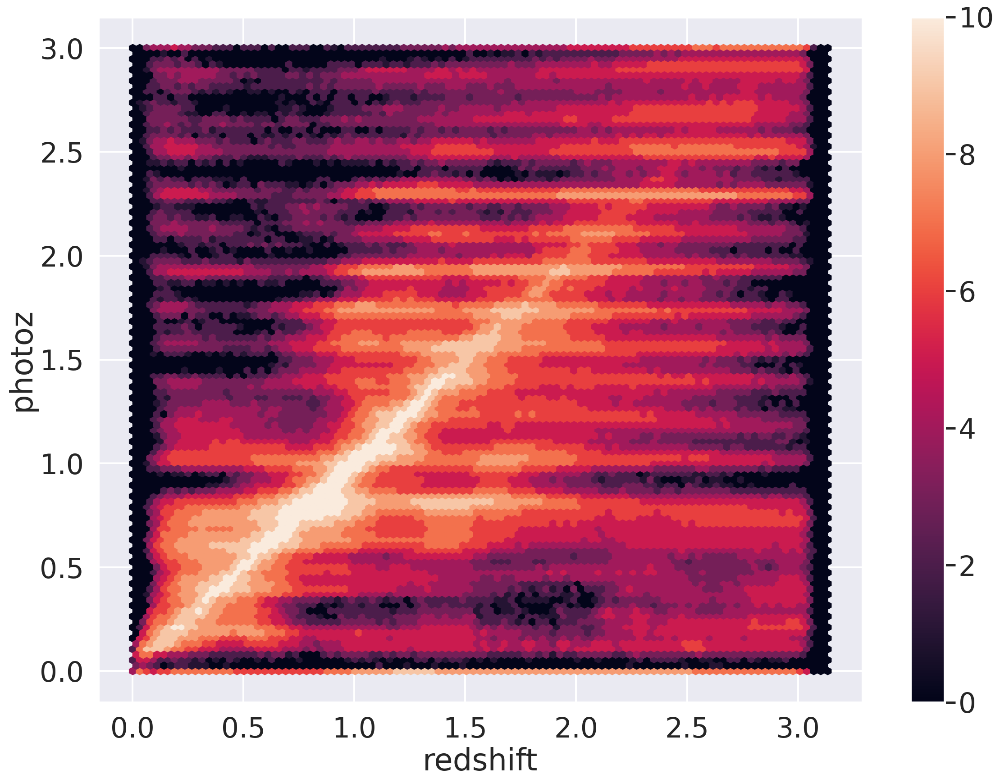

In [4]:
plt.hexbin(df2['redshift'], df2['photoz_mode'], bins=np.logspace(0, 4, 10))
plt.colorbar()
plt.xlabel('redshift')
plt.ylabel('photoz')

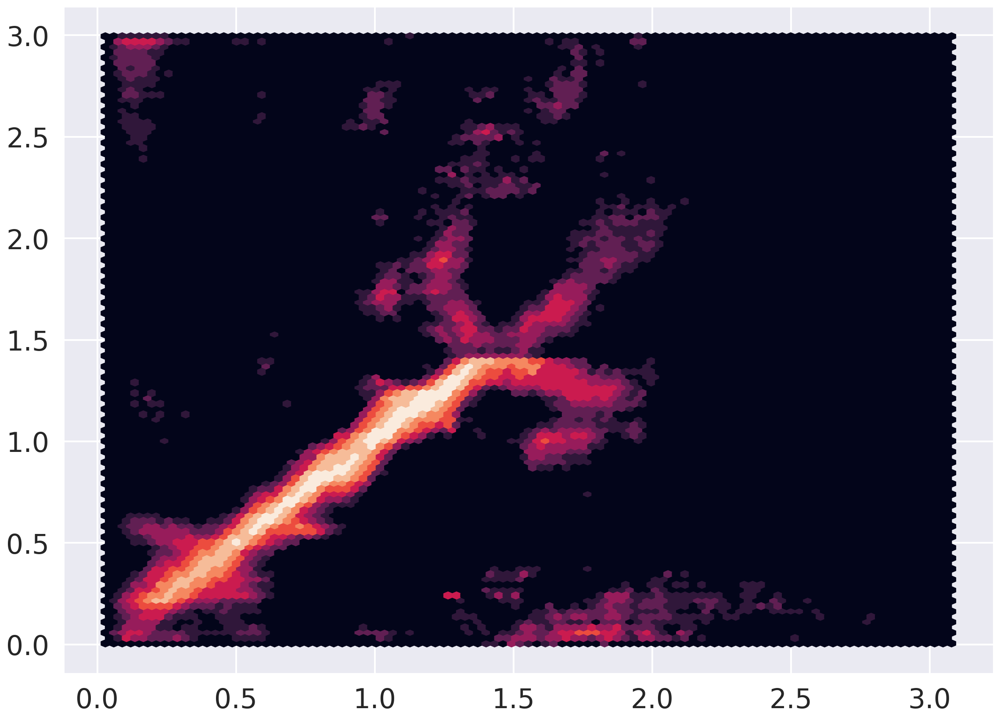

In [79]:
plt.hexbin(bpz['redshift_lsst'], bpz['galaxy_points_z_mode'], bins=np.logspace(1, 4, 10))

# Error Statistics
## Robust Bias (with outliers taken out first)

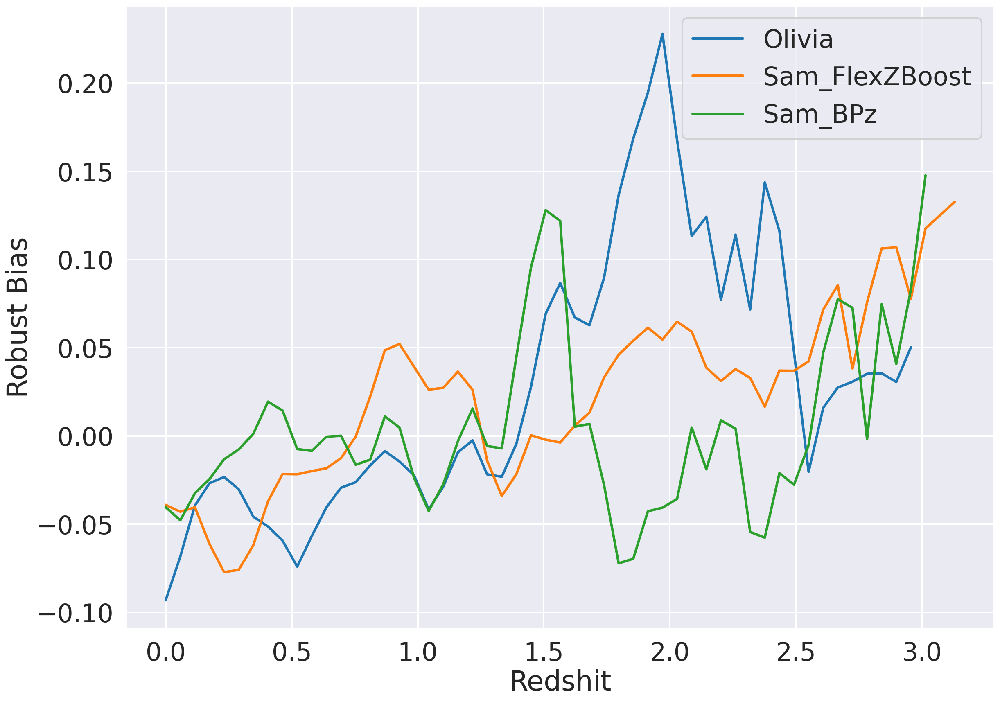

In [54]:

save = {}
edges = np.linspace(0, 4, 70)
for data in zip([df1, df2, bpz],
                ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                ['rz_real', 'redshift', 'redshift_lsst'],
                ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
    binned_data = []
    for i in range(len(edges)-1):
        df = data[0]
        data_in_bin = df[np.logical_and(df[data[2]]>edges[i], df[data[2]]<edges[i+1])] 
        outliers = np.abs(data_in_bin[data[2]] - data_in_bin[data[3]]) > 3 * iqr(df[data[2]] - df[data[3]])
        binned_data.append(data_in_bin[~outliers])
    x = edges[:-1]
    y = [np.mean(d[data[2]])-np.mean(d[data[3]]) for d in binned_data]
    sns.lineplot(x, y, label=data[1], markers=True)
    save[data[1]] = {'redshift':x, 'bias':y}
plt.legend()
plt.ylabel('Robust Bias')
plt.xlabel('Redshit')

pickle.dump(save, open('robust_bias.p', 'wb'))

## Bias

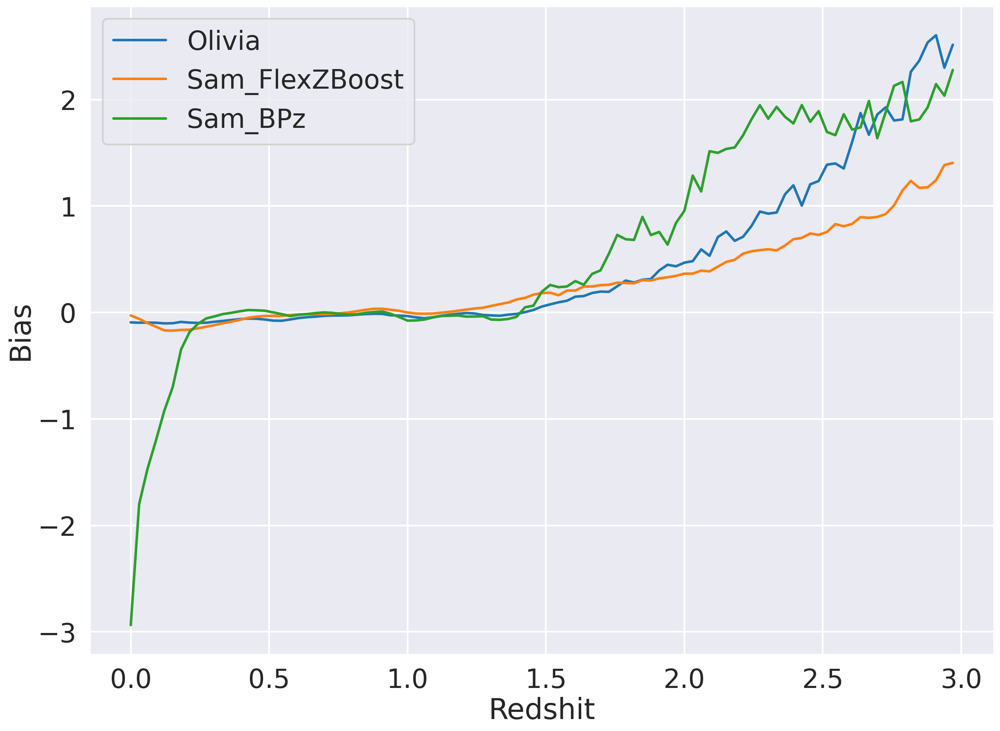

In [59]:
save = {}
edges = np.linspace(0, 3, 100)
for data in zip([df1, df2, bpz],
                ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                ['rz_real', 'redshift', 'redshift_lsst'],
                ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
    binned_data = []
    for i in range(len(edges)-1):
        df = data[0]
        data_in_bin = df[np.logical_and(df[data[2]]>edges[i], df[data[2]]<edges[i+1])] 
        binned_data.append(data_in_bin)
    x = edges[:-1]
    y = [np.mean(d[data[2]])-np.mean(d[data[3]]) for d in binned_data]
    sns.lineplot(x, y, label=data[1], markers=True)
    save[data[1]] = {'redshift':x, 'bias':y}
plt.ylabel('Bias')
plt.xlabel('Redshit')
plt.legend()

pickle.dump(save, open('bias.p', 'wb'))

## Standard Deviation

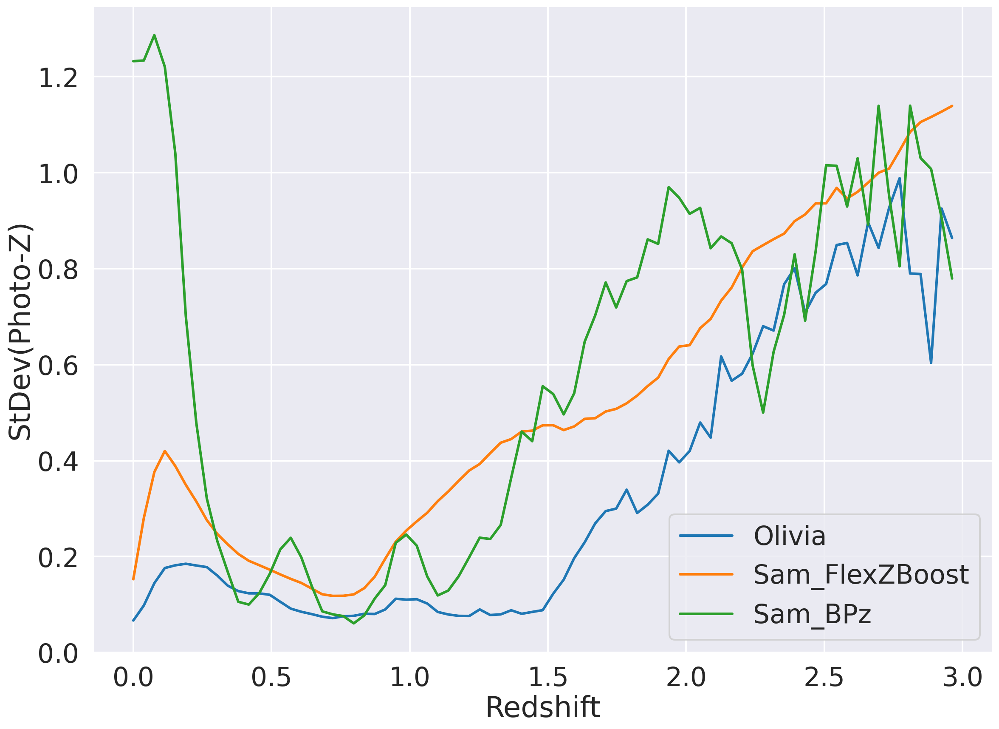

In [58]:
save = {}
edges = np.linspace(0, 3, 80)
for data in zip([df1, df2, bpz],
                ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                ['rz_real', 'redshift', 'redshift_lsst'],
                ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
    binned_data = []
    y = []
    for i in range(len(edges)-1):
        df = data[0]
        data_in_bin = df[np.logical_and(df[data[2]]>edges[i], df[data[2]]<edges[i+1])] 
        binned_data.append(data_in_bin)
        y.append(np.std(data_in_bin[data[3]]))
    x =  edges[:-1]
    sns.lineplot(x, y, label=data[1], markers=True)
    save[data[1]] = {'redshift':x, 'scatter':y}
plt.legend()
plt.xlabel('Redshift')
plt.ylabel('StDev(Photo-Z)')
pickle.dump(save, open('scatter.p', 'wb'))

## Outlier Fraction

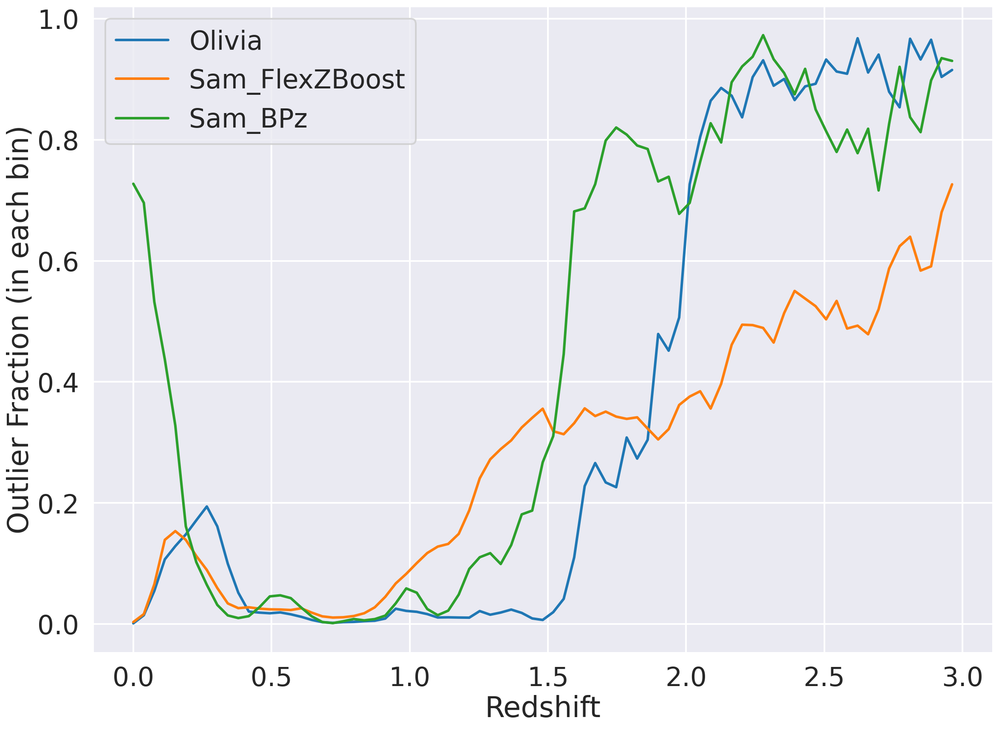

In [57]:
save = {}
edges = np.linspace(0, 3, 80)
for data in zip([df1, df2, bpz],
                ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                ['rz_real', 'redshift', 'redshift_lsst'],
                ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
    binned_data, y = [], []
    for i in range(len(edges)-1):
        df = data[0]
        data_in_bin = df[np.logical_and(df[data[2]]>edges[i], df[data[2]]<edges[i+1])] 
        errors = data_in_bin[data[2]] - data_in_bin[data[3]]
        outliers = np.abs(data_in_bin[data[2]] - data_in_bin[data[3]]) > 3 * iqr(df[data[2]] - df[data[3]])
        try:
            outlier_fraction = len(outliers[outliers==True])/(len(outliers))
        except ZeroDivisionError:
            outlier_fraction = 0
        y.append(outlier_fraction)
    x =  edges[:-1]
    sns.lineplot(x, y, label=data[1], markers=True)
    save[data[1]] = {'redshift':x, 'outlier_fraction':y}
plt.legend()
plt.xlabel('Redshift')
plt.ylabel('Outlier Fraction (in each bin)')
pickle.dump(save, open('outlier_frac.p', 'wb'))

In [25]:
outlierfrac = pickle.load(open('outlier_frac_df.p', 'rb'))

In [30]:
sum(outliers['outlier_fraction'])

0.15369625102581166

In [34]:
outliers = pd.DataFrame(outliers)

In [37]:
sum(outliers[np.logical_and(outliers['redshift']>0.05, outliers['redshift']<0.55)]['outlier_fraction'])

0.009780926739896716

In [40]:
    print(inbin)

0.009780926739896716
0.0022554556214481247
0.020947481173020983
0.04831089597165704
0.07238322930340861


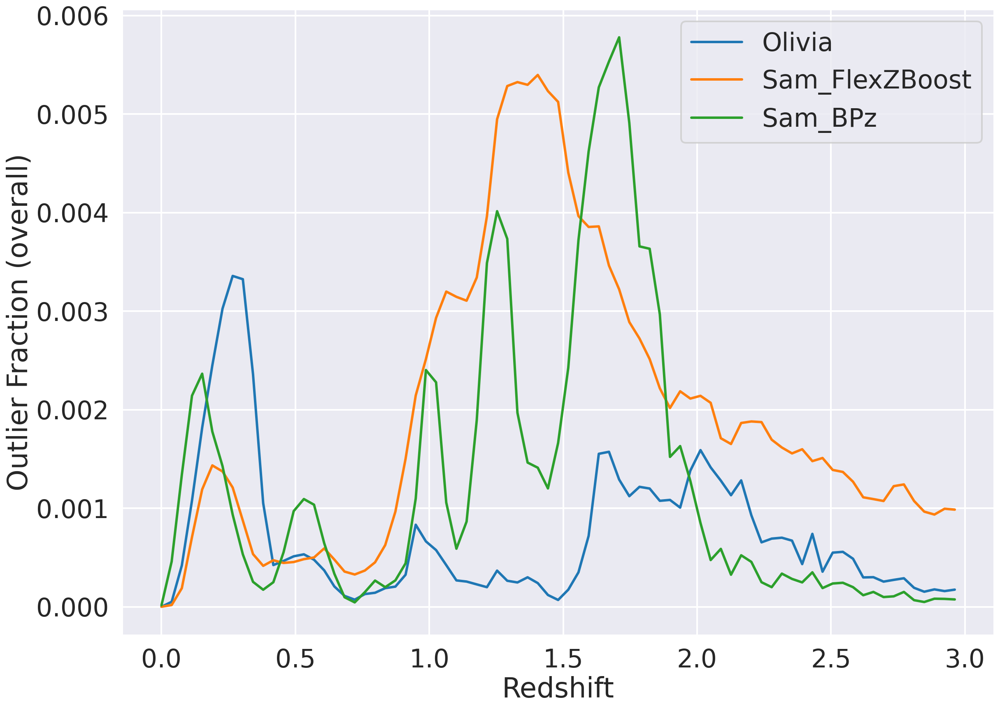

In [56]:
save = {}
edges = np.linspace(0, 3, 80)
for data in zip([df1, df2, bpz],
                ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                ['rz_real', 'redshift', 'redshift_lsst'],
                ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
    binned_data, y = [], []
    for i in range(len(edges)-1):
        df = data[0]
        data_in_bin = df[np.logical_and(df[data[2]]>edges[i], df[data[2]]<edges[i+1])] 
        errors = data_in_bin[data[2]] - data_in_bin[data[3]]
        outliers = np.abs(data_in_bin[data[2]] - data_in_bin[data[3]]) > 3 * iqr(df[data[2]] - df[data[3]])
        try:
            outlier_fraction = len(outliers[outliers==True])/(len(df))
        except ZeroDivisionError:
            outlier_fraction = 0
        y.append(outlier_fraction)
    x =  edges[:-1]
    sns.lineplot(x, y, label=data[1], markers=True)
    save[data[1]] = {'redshift':x, 'outlier_fraction':y}
plt.legend()
plt.xlabel('Redshift')
plt.ylabel('Outlier Fraction (overall)')
pickle.dump(save, open('outlier_frac_df.p', 'wb'))

## Kernel Density Estimation of Outliers

Titles of plots correspond to the redshift bins

In [3]:
from sklearn.neighbors import KernelDensity

Text(0.5, 0, 'z_phot - z_real')

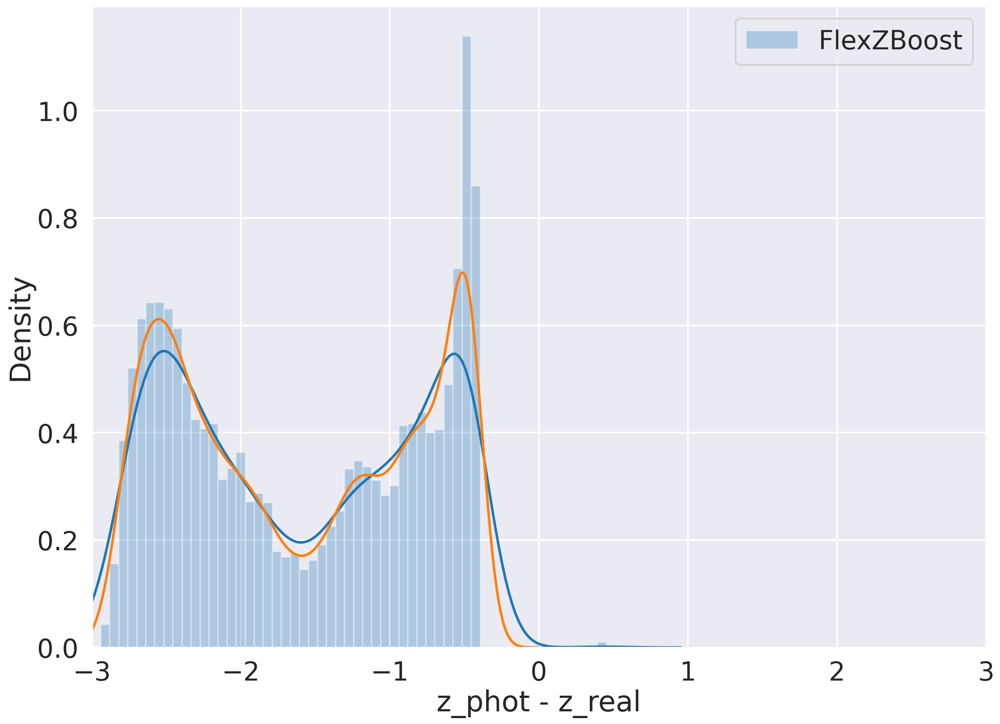

In [4]:
edges = [0.05, 0.55]
plt.figure()
i = 0
data = [df2,
        'FlexZBoost',
        'redshift',
        'photoz_mode']
df = data[0]
errors = df[data[2]] - df[data[3]]
outliers = np.abs(errors) > 3 * iqr(errors)
data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])] 
X = data_in_bin[outliers][data[3]] - data_in_bin[outliers][data[2]]
sns.distplot(X, label=data[1], hist_kws=dict(alpha=0.3), kde_kws=dict(bw=0.2), bins=np.linspace(-3 ,3, 100));

kde = KernelDensity(bandwidth=0.1, leaf_size=10)
kde.fit(np.array(X).reshape(-1, 1))
Xhat = np.linspace(-3, 0, 1000)
yhat = np.exp(kde.score_samples(Xhat.reshape(-1, 1)))

plt.plot(Xhat, yhat)
plt.legend()
plt.xlim((-3, 3))
#plt.title('{:.1f} to {:.1f}'.format(edge, edges[i+1]))
plt.xlabel('z_phot - z_real')

In [ ]:
edges = [0.05, 0.55]
plt.figure()
i = 0
data = [df2,
        'FlexZBoost',
        'redshift',
        'photoz_mode']
df = data[0]
errors = df[data[2]] - df[data[3]]
outliers = np.abs(errors) > 3 * iqr(errors)
data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])] 
X = data_in_bin[outliers][data[3]] - data_in_bin[outliers][data[2]]
plt.hist(X, bins=np.linspace(-3 ,3, 100), density=True)
#sns.distplot(X, label=data[1], hist_kws=dict(alpha=0.3), kde_kws=dict(bw=0.2), bins=np.linspace(-3 ,3, 100));
for bandwidth in np.linspace(0.08, 0.2, 6):
    kde = KernelDensity(bandwidth=bandwidth, leaf_size=10)
    kde.fit(np.array(X).reshape(-1, 1))
    Xhat = np.linspace(-3, 0, 1000)
    yhat = np.exp(kde.score_samples(Xhat.reshape(-1, 1)))

    plt.plot(Xhat, yhat)
    plt.legend()
    plt.xlim((-3, 3))
    #plt.title('{:.1f} to {:.1f}'.format(edge, edges[i+1]))
    #plt.xlabel('z_phot - z_real')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [3]:
from sklearn.neighbors import KernelDensity
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV

In [8]:
kde.score(np.array(X[::100]).reshape(-1, 1))

-597.1489792621775

In [4]:
def getdata(edges):
    center = [0.5*(edges[i]+edges[i+1]) for i in range(len(edges)-1)]
    df = df2
    errors = df['redshift'] - df['photoz_mode']
    outliers = np.abs(errors) > 3 * iqr(errors)
    data_in_bin = df[np.logical_and(df['photoz_mode']>edges[0], df['photoz_mode']<edges[1])]
    X = - data_in_bin[outliers]['photoz_mode'] + data_in_bin[outliers]['redshift'] + center
    return X

In [5]:
edges = [0.05, 0.55]

In [6]:
X = getdata([0.05, 0.55])

In [16]:
shape(X)

(69102,)

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
train, test = train_test_split(X, test_size=0.5)

(array([  19.,    0., 5530., 5108., 3795., 2602., 2548., 4307., 6901.,
        3741.]),
 array([-0.15904815,  0.18429779,  0.52764372,  0.87098965,  1.21433559,
         1.55768152,  1.90102746,  2.24437339,  2.58771932,  2.93106526,
         3.27441119]),
 <BarContainer object of 10 artists>)

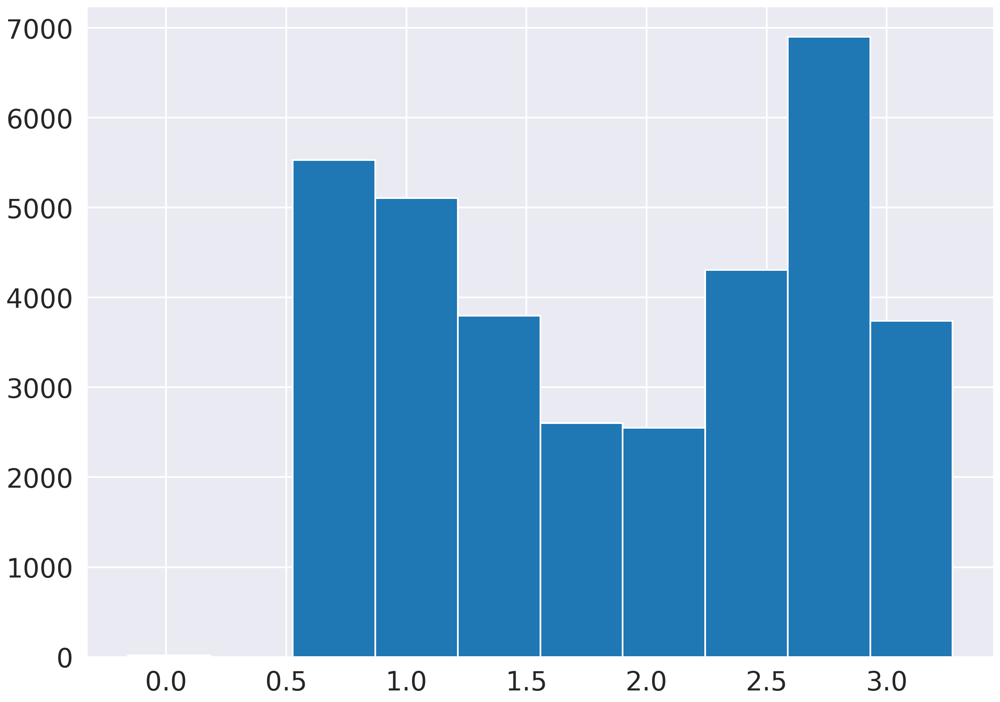

In [24]:
plt.hist(test)

In [32]:
scores

[-29770]

In [40]:
np.linspace(0.0001, 0.1, 10)

array([0.0001, 0.0112, 0.0223, 0.0334, 0.0445, 0.0556, 0.0667, 0.0778,
       0.0889, 0.1   ])

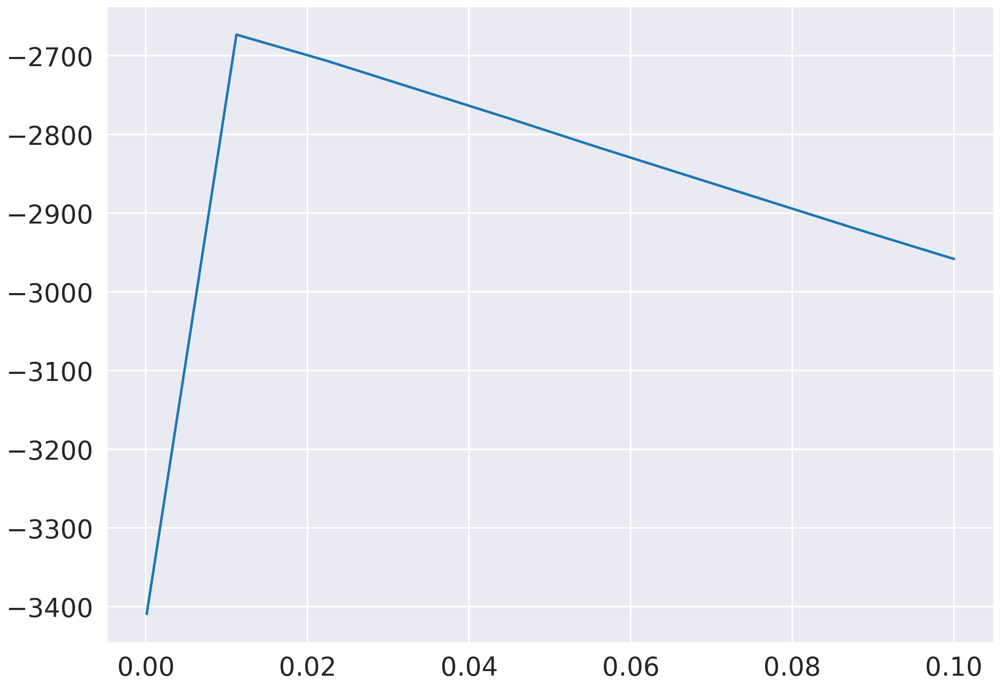

In [39]:
plt.plot(np.linspace(0.0001, 0.1, 10), scores)

In [9]:
from sklearn.model_selection import GridSearchCV

In [12]:
gs = GridSearchCV(KernelDensity(), param_grid={'bandwidth': np.linspace(0.005, 0.05, 10)}, cv=5)

In [54]:
gs.score(np.array(test).reshape(-1, 1))

-2705.0233410361498

In [58]:
gs.best_params_

{'bandwidth': 0.0112}

In [69]:
np.linspace(0.001, 0.1, 50)

array([0.001     , 0.00302041, 0.00504082, 0.00706122, 0.00908163,
       0.01110204, 0.01312245, 0.01514286, 0.01716327, 0.01918367,
       0.02120408, 0.02322449, 0.0252449 , 0.02726531, 0.02928571,
       0.03130612, 0.03332653, 0.03534694, 0.03736735, 0.03938776,
       0.04140816, 0.04342857, 0.04544898, 0.04746939, 0.0494898 ,
       0.0515102 , 0.05353061, 0.05555102, 0.05757143, 0.05959184,
       0.06161224, 0.06363265, 0.06565306, 0.06767347, 0.06969388,
       0.07171429, 0.07373469, 0.0757551 , 0.07777551, 0.07979592,
       0.08181633, 0.08383673, 0.08585714, 0.08787755, 0.08989796,
       0.09191837, 0.09393878, 0.09595918, 0.09797959, 0.1       ])

In [79]:
len(train)

34551

In [80]:
len(X)

69102

In [81]:
gs.cv

In [86]:
gs = GridSearchCV(KernelDensity(), param_grid={'bandwidth': np.linspace(0.001, 0.1, 4)}, cv=5)

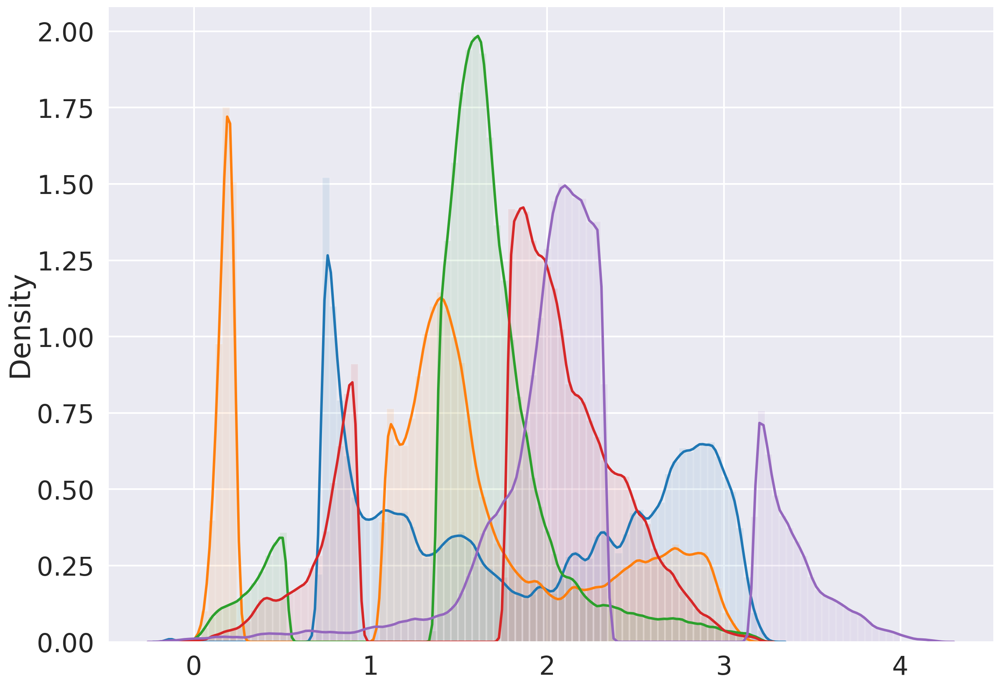

In [22]:
KDEs = {}
bandwidths = [0.02, 0.02, 0.02, 0.02, 0.05]
for i, (e1, e2) in enumerate(zip([0.05, 0.55, 0.75, 1.15, 1.55], [0.55, 0.75, 1.15, 1.55, 3.95])):
    X = getdata([e1, e2])
    kde = KernelDensity(bandwidth=bandwidths[i])
    kde.fit(np.array(np.array(X).reshape(-1, 1)))
    KDEs[i] = kde
    sns.distplot(X, hist_kws=dict(alpha=0.1), kde_kws=dict(bw=0.03), bins=np.linspace(0 , 4, 100));

In [18]:
pickle.dump(KDEs, open('KDEs.p', 'wb'))

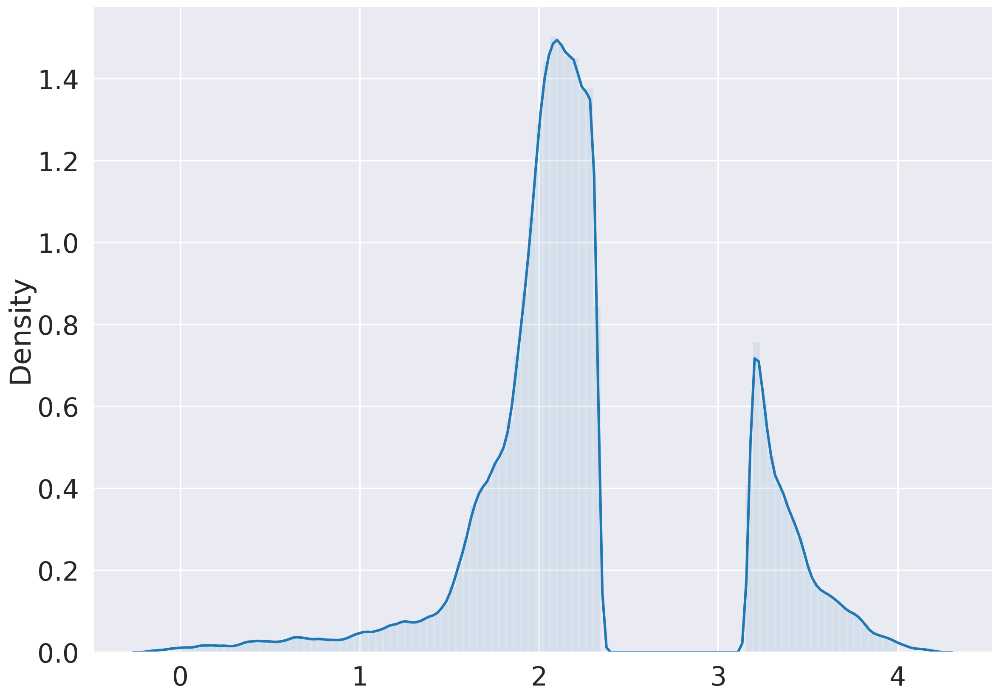

In [21]:
sns.distplot(X, hist_kws=dict(alpha=0.1), kde_kws=dict(bw=0.03), bins=np.linspace(0 , 4, 100));

In [26]:
gs.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [29]:
best

[0.005, 0.005]

In [35]:
np.linspace(0.001, 0.1, 100)

array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009,
       0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017, 0.018,
       0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026, 0.027,
       0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035, 0.036,
       0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044, 0.045,
       0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053, 0.054,
       0.055, 0.056, 0.057, 0.058, 0.059, 0.06 , 0.061, 0.062, 0.063,
       0.064, 0.065, 0.066, 0.067, 0.068, 0.069, 0.07 , 0.071, 0.072,
       0.073, 0.074, 0.075, 0.076, 0.077, 0.078, 0.079, 0.08 , 0.081,
       0.082, 0.083, 0.084, 0.085, 0.086, 0.087, 0.088, 0.089, 0.09 ,
       0.091, 0.092, 0.093, 0.094, 0.095, 0.096, 0.097, 0.098, 0.099,
       0.1  ])

In [ ]:
best = []
for e1, e2 in zip([0.05, 0.55, 0.75, 1.15, 1.55], [0.55, 0.75, 1.15, 1.55, 3.95]):
    X = getdata([e1, e2])
    gs = GridSearchCV(KernelDensity(), param_grid={'bandwidth': np.linspace(0.001, 0.1, 100)}, cv=5, n_jobs=20)
    gs.fit(np.array(X).reshape(-1, 1))
    best.append(gs.best_params_['bandwidth'])
    pickle.dump(best, open('bandwidths.p', 'wb'))

In [31]:
best

[0.0048000000000000004, 0.02, 0.02, 0.02, 0.02]

In [ ]:
1

In [ ]:
for num, (e1, e2) in enumerate(zip([0.05, 0.55, 0.75, 1.15, 1.55], [0.55, 0.75, 1.15, 1.55, 3.95])):
    sns.distplot(X, hist_kws=dict(alpha=0.2), kde_kws=dict(bw=best[num]), bins=np.linspace(0 , 4, 100), label=f'{e1:.1f} to {e2:.1f}');
plt.xlim((0, 4))
plt.xlabel('redshift')
plt.legend()


total score for bw 0.02 is -393910, broken down [-64918, -125428, -24922, -178642]
total score for bw 0.04 is -72200, broken down [-11657, -26777, -4431, -29335]
total score for bw 0.06 is -34489, broken down [-5477, -12697, -2214, -14101]
total score for bw 0.08 is -21016, broken down [-3292, -7734, -1409, -8581]
total score for bw 0.10 is -14582, broken down [-2264, -5384, -1014, -5920]
total score for bw 0.12 is -10971, broken down [-1694, -4070, -785, -4422]
total score for bw 0.14 is -8726, broken down [-1339, -3254, -638, -3495]
total score for bw 0.16 is -7234, broken down [-1102, -2710, -537, -2885]
total score for bw 0.18 is -6193, broken down [-935, -2328, -465, -2465]
total score for bw 0.20 is -5444, broken down [-814, -2050, -412, -2168]


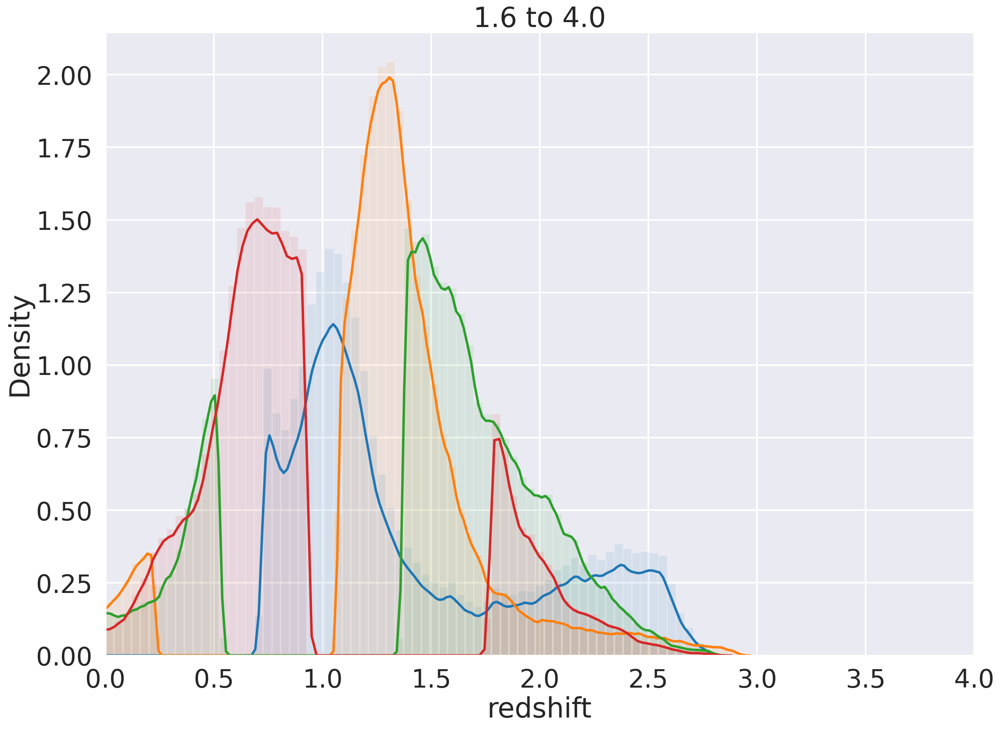

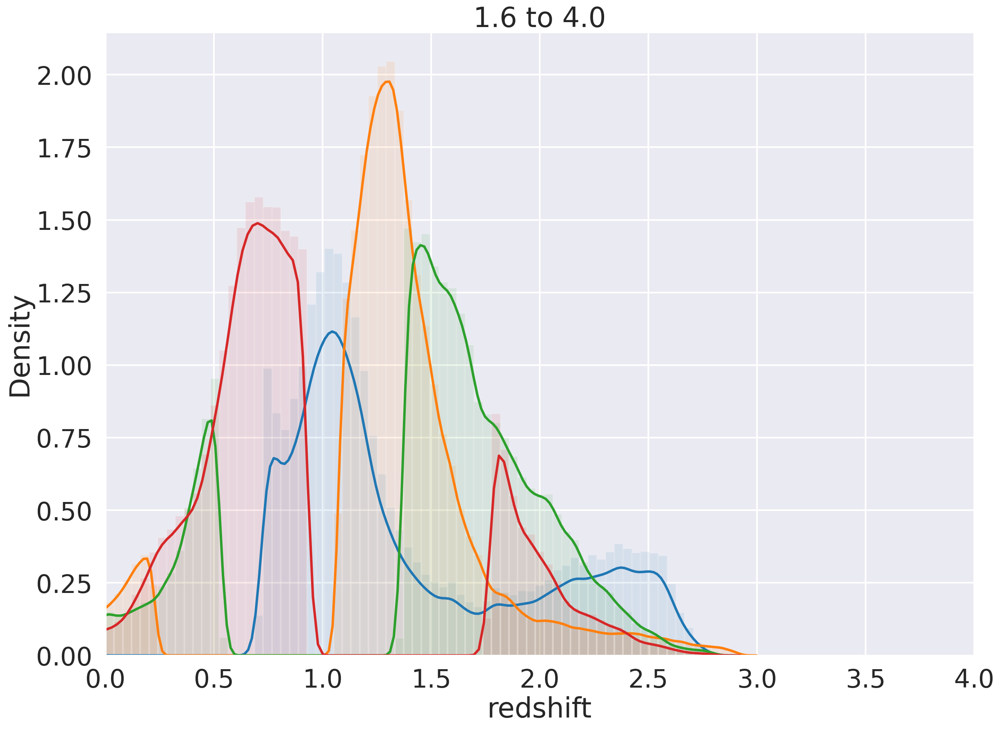

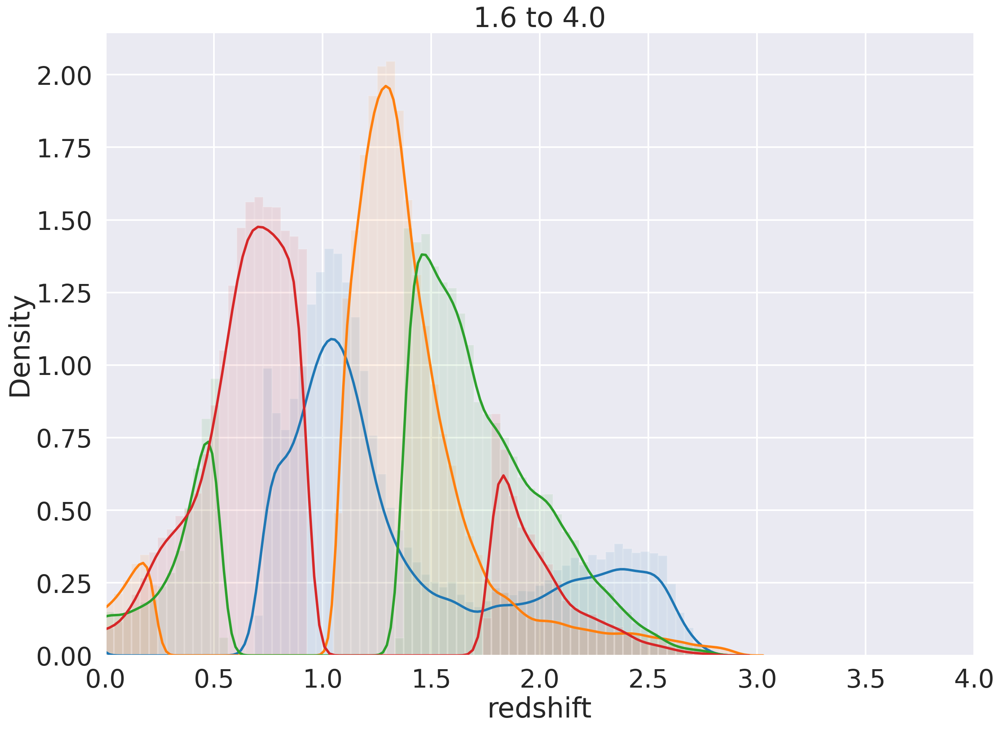

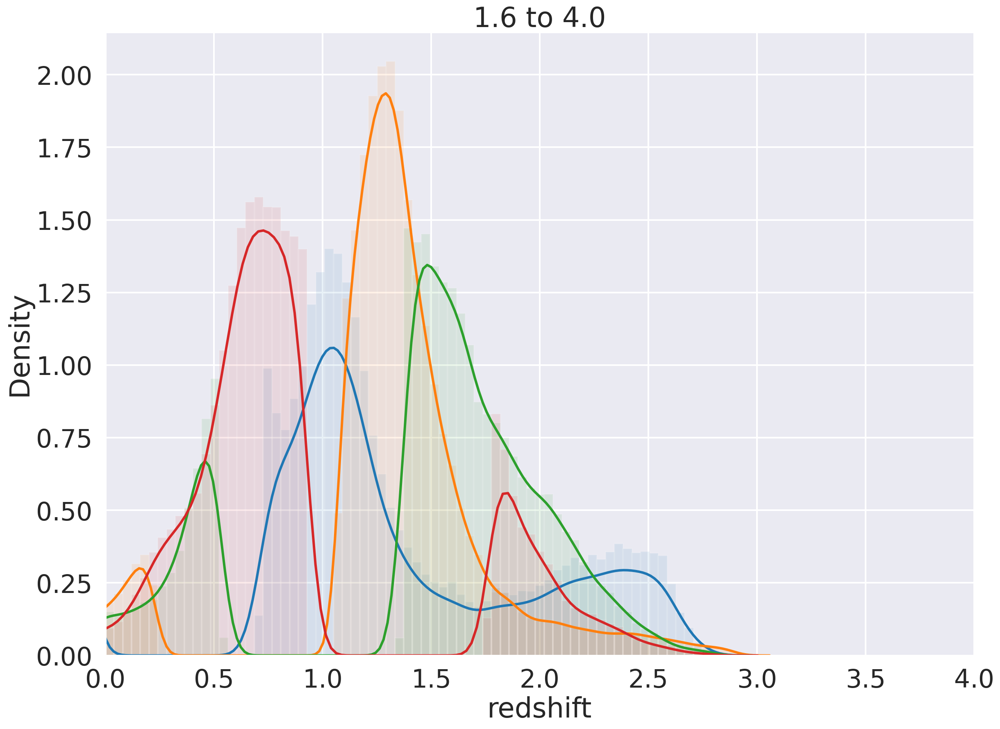

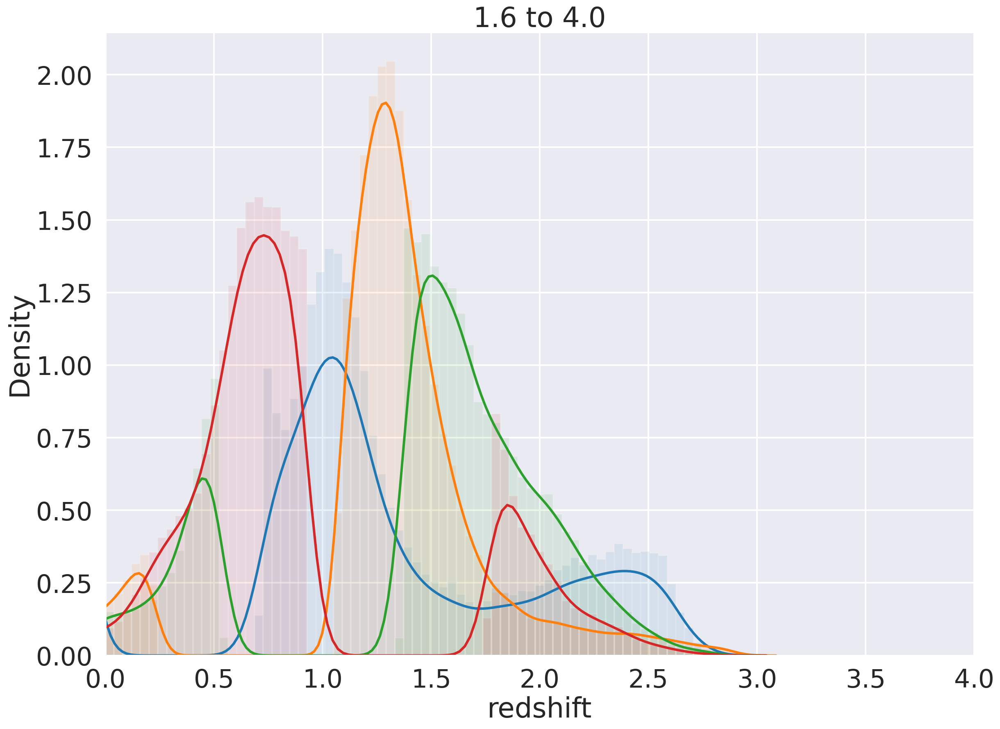

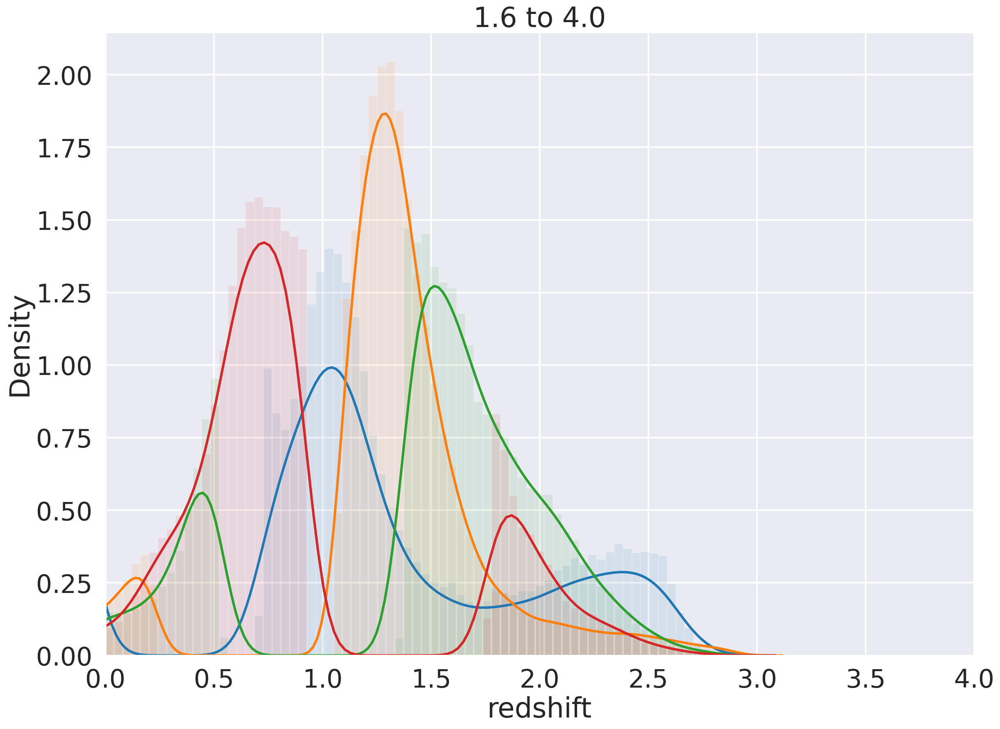

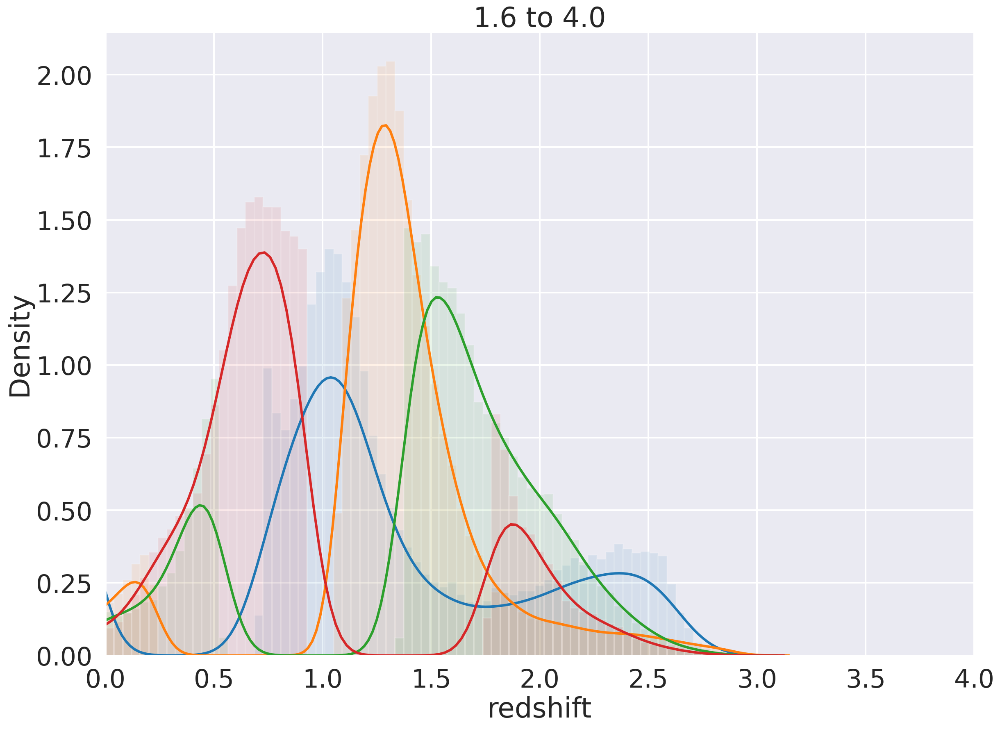

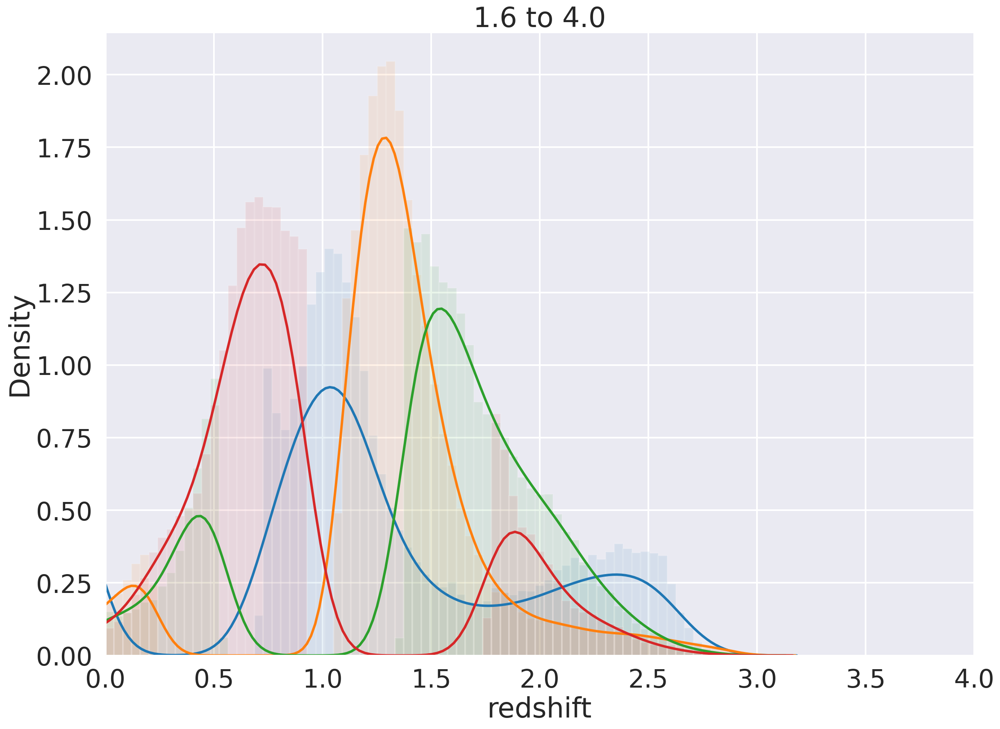

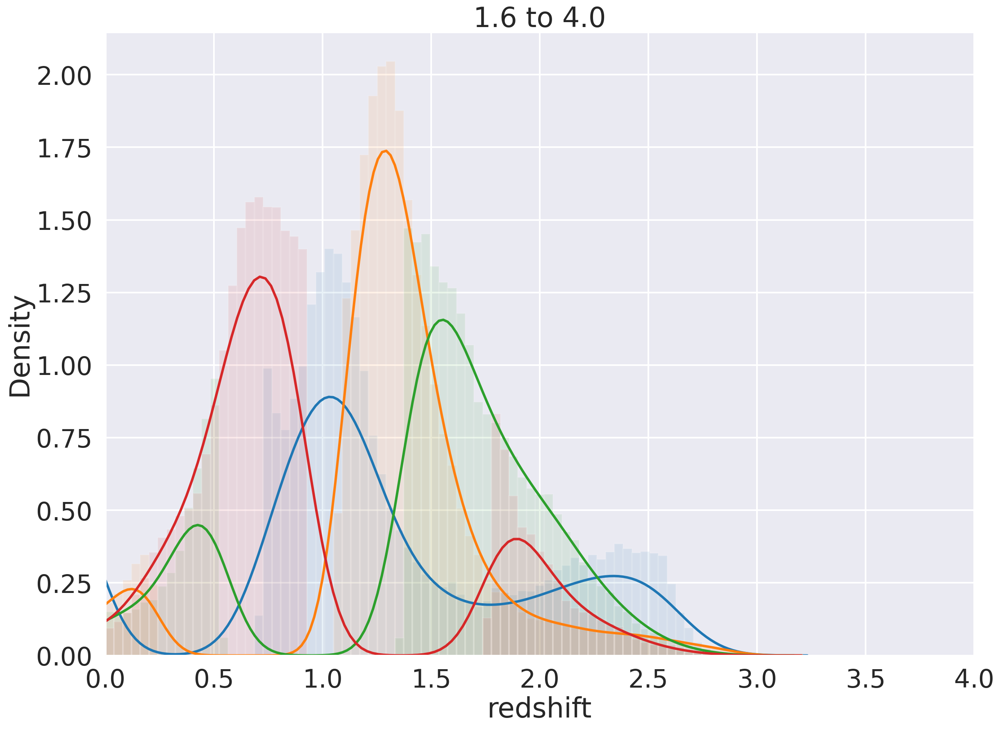

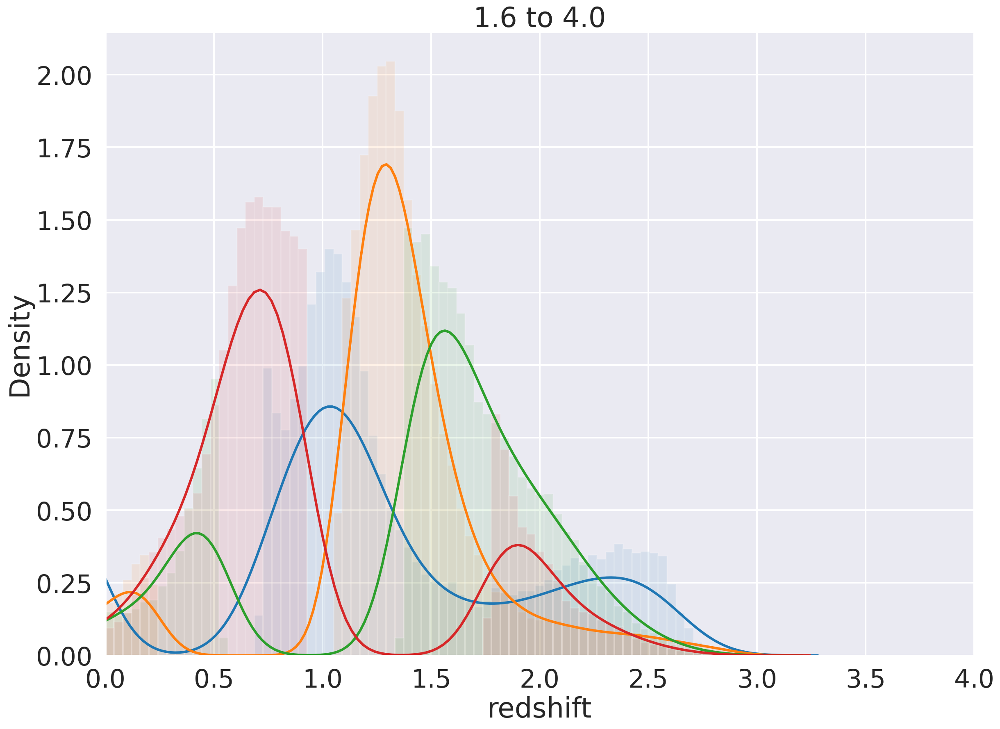

In [31]:
edges = [0.05, 0.55]
for bandwidth in np.linspace(0.02, 0.2, 10):
    X = getdata(edges)
    kde = KernelDensity(bandwidth=bandwidth, leaf_size=10)
    kde.fit(np.array(X).reshape(-1, 1))
    edges = [0.55
    plt.figure()
    scores = []
    for num, i in enumerate(range(len(edges)-1)):
        X = getdata(edges[i:i+2])
        sns.distplot(X, hist_kws=dict(alpha=0.1), kde_kws=dict(bw=bandwidth), bins=np.linspace(0 , 4, 100));
        scores.append(int(kde.score(np.array(X[::500]).reshape(-1,1))))
        plt.xlim((0, 4))
        plt.title('{:.1f} to {:.1f}'.format(edges[i], edges[i+1]))
        plt.xlabel('redshift')
    print(f'total score for bw {bandwidth:.2f} is {sum(scores)}, broken down {scores}')

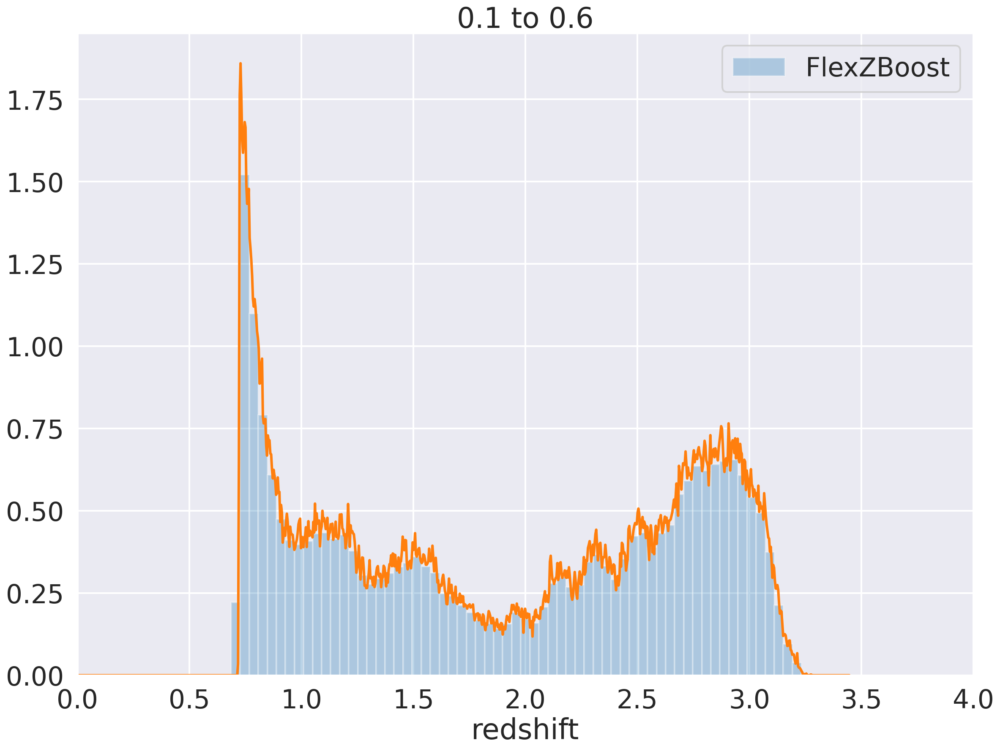

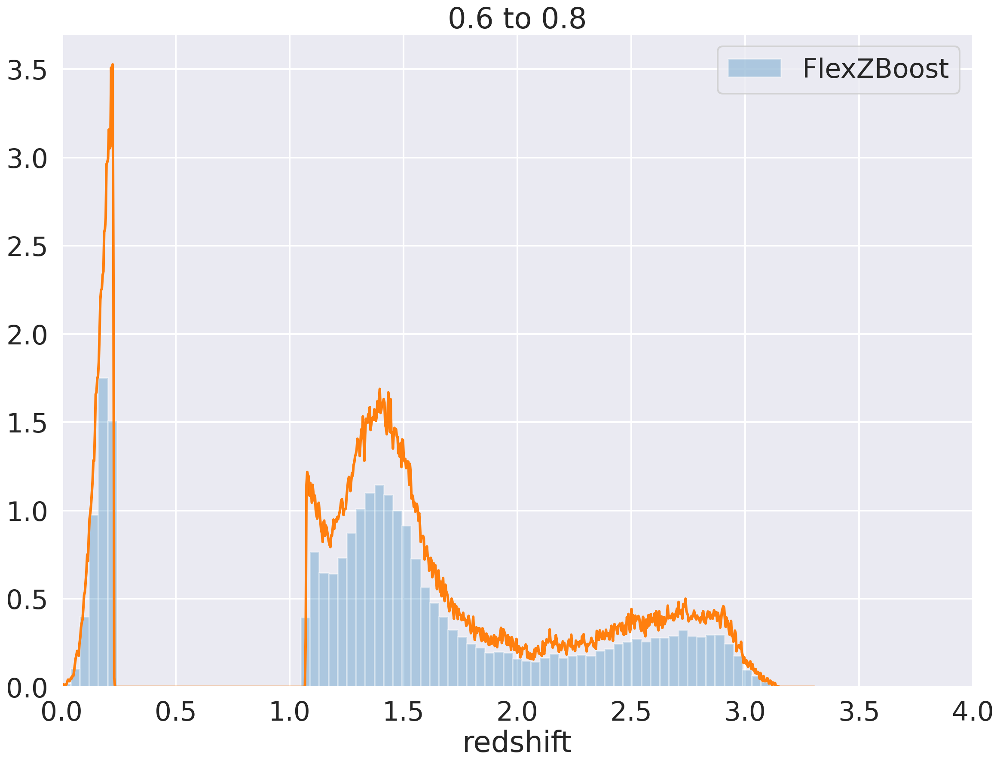

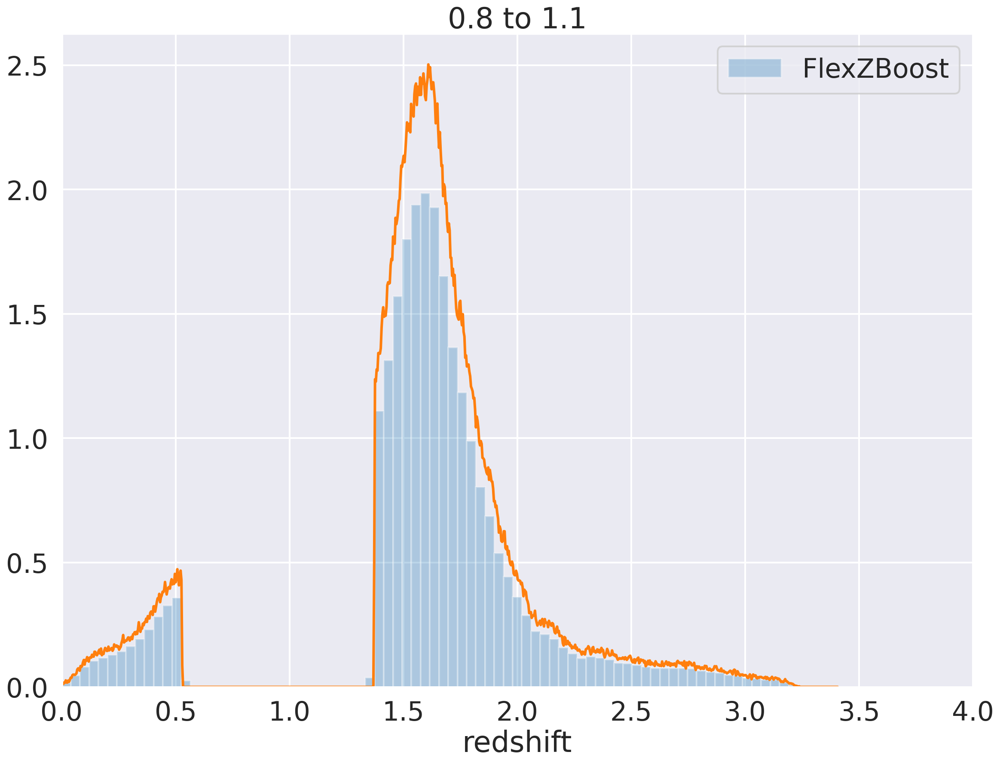

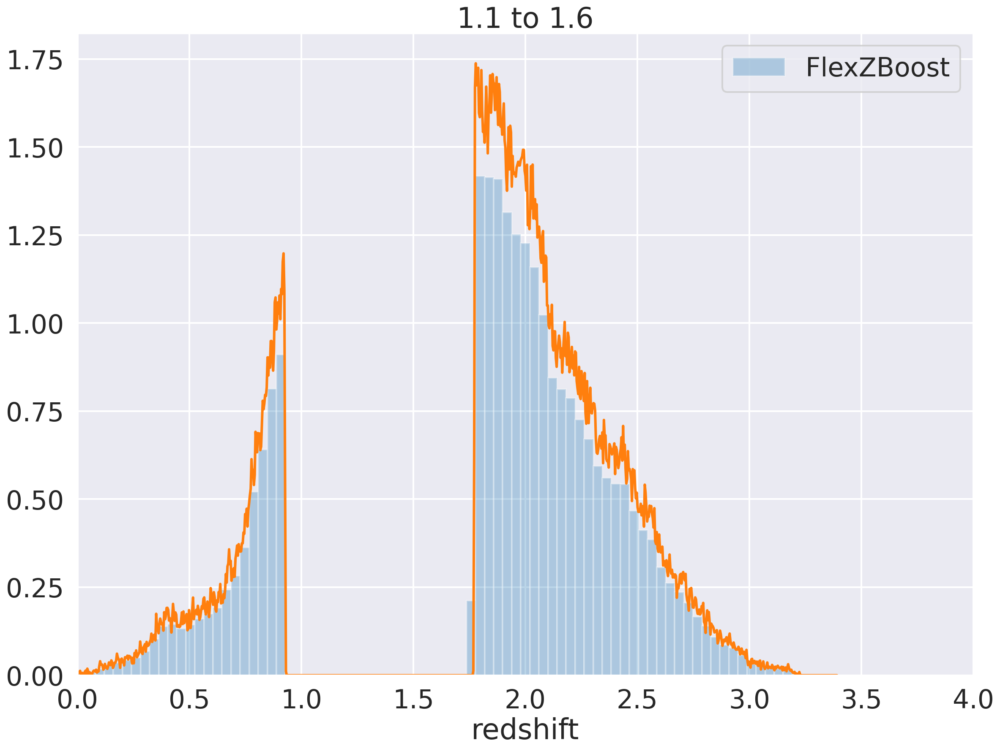

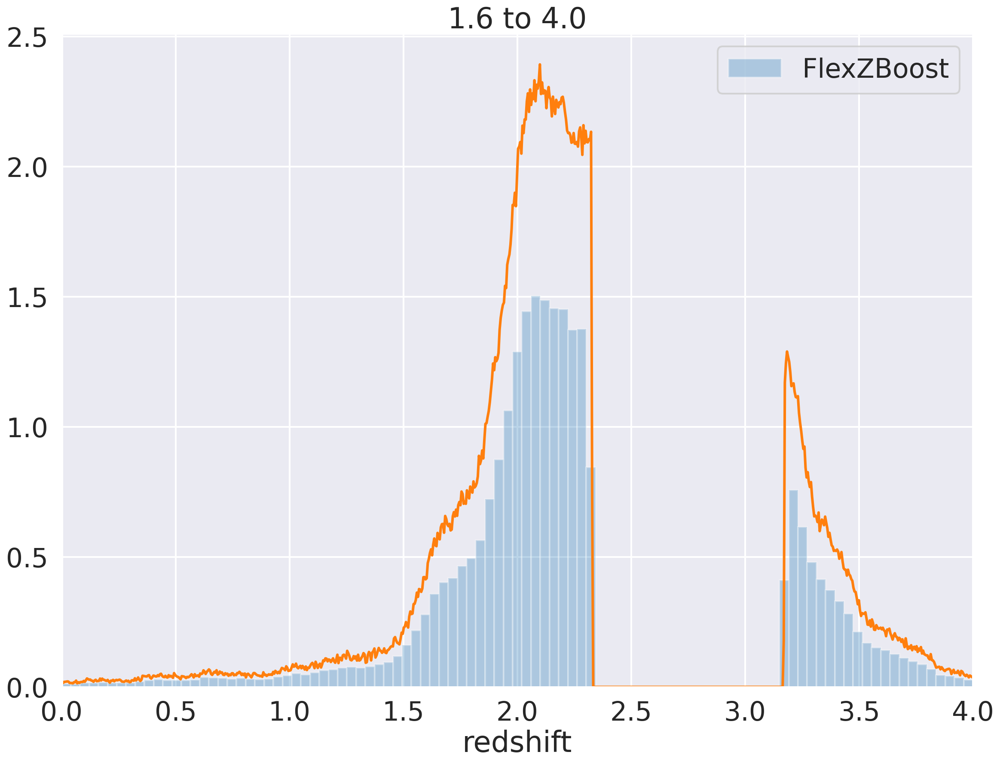

In [15]:
edges = [0.05, 0.55, 0.75, 1.15, 1.55, 3.95]
for i in range(len(edges)-1):
    plt.figure()
    for data in zip([df2],
                    ['FlexZBoost'],
                    ['redshift'],
                    ['photoz_mode']):
        df = data[0]
        errors = df[data[2]] - df[data[3]]
        outliers = np.abs(errors) > 3 * iqr(errors)
        data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])]
        data_in_bin = np.array(- data_in_bin[outliers][data[3]] + data_in_bin[outliers][data[2]] + centers[i])
        x, y = KDEpy.FFTKDE(kernel='gaussian', bw='ISJ').fit(data_in_bin).evaluate()

        sns.distplot(data_in_bin, label=data[1], hist_kws=dict(alpha=0.3), norm_hist=True, kde=False, bins=np.linspace(0 , 4, 100));
        plt.plot(x, y)
    plt.legend()
    plt.xlim((0, 4))
    plt.title('{:.1f} to {:.1f}'.format(edges[i], edges[i+1]))
    plt.xlabel('redshift')

0.006905043119965759 3.1344111854044394
0.0531608024916419 3.063302628029434
0.06723632257392587 3.071758126192462
0.05648823261395064 3.0623326349811864
0.0007851380029477717 3.1327207932653023


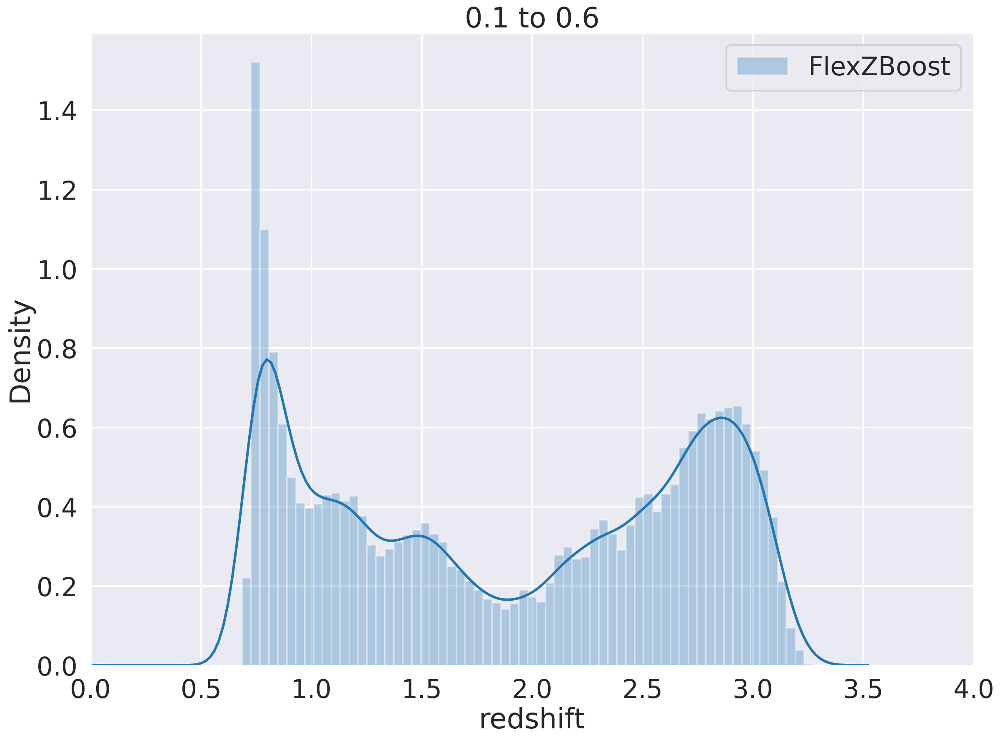

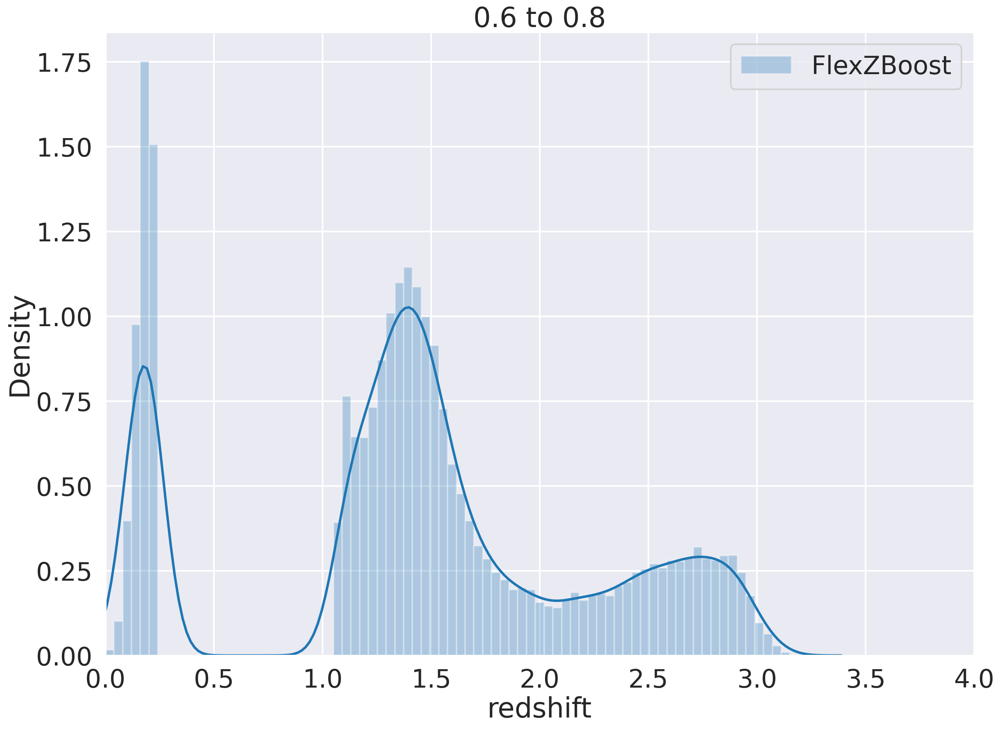

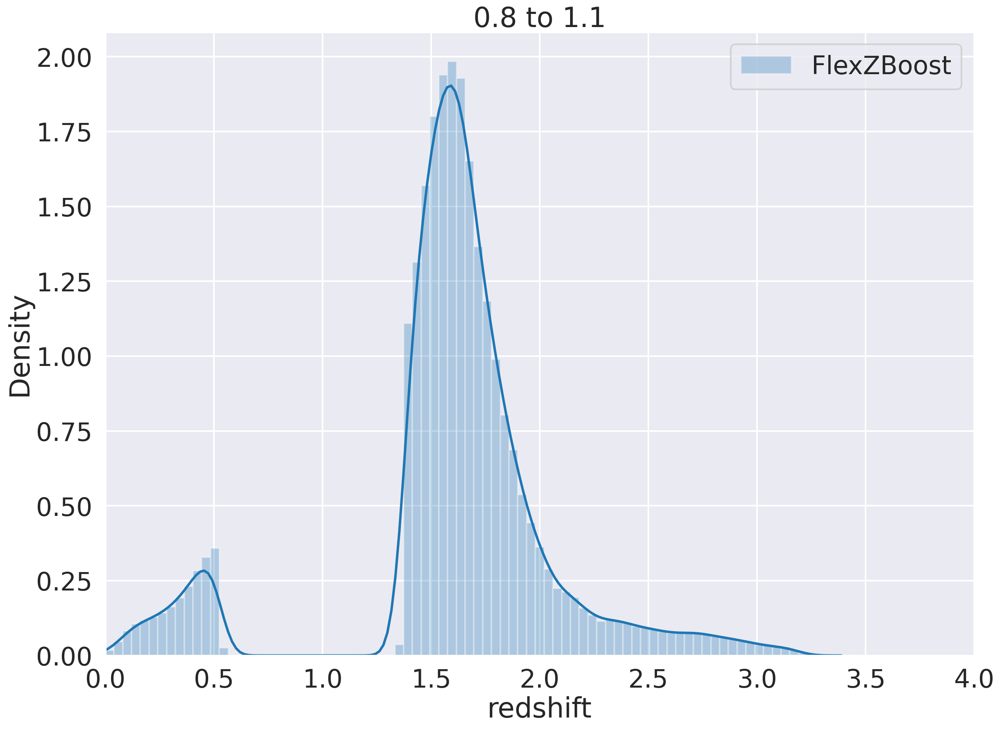

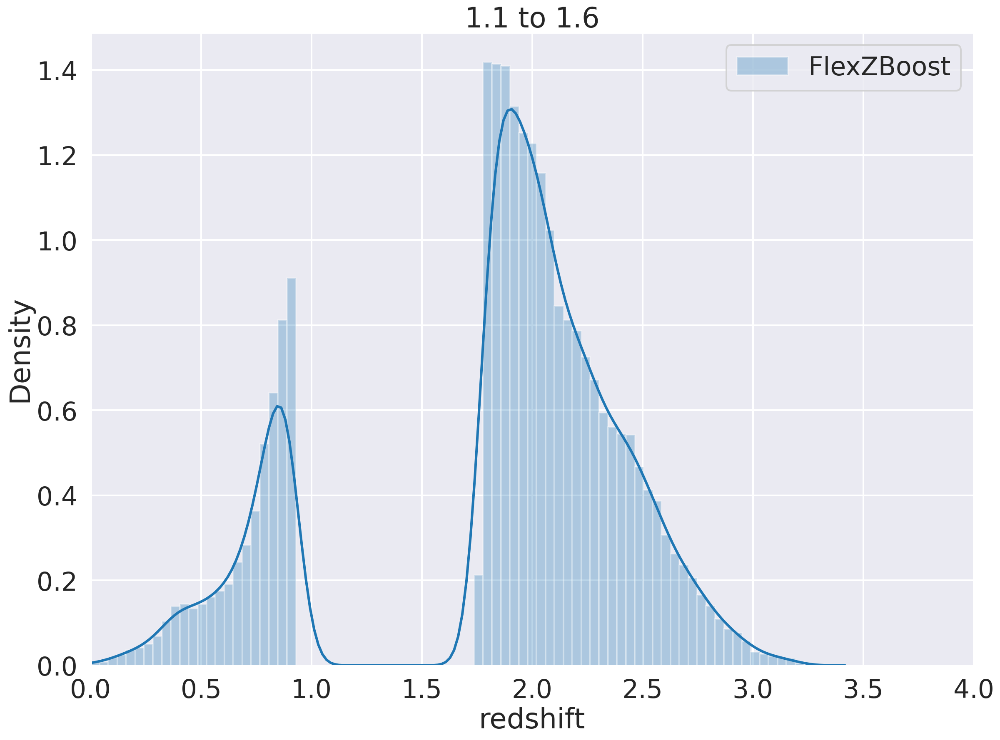

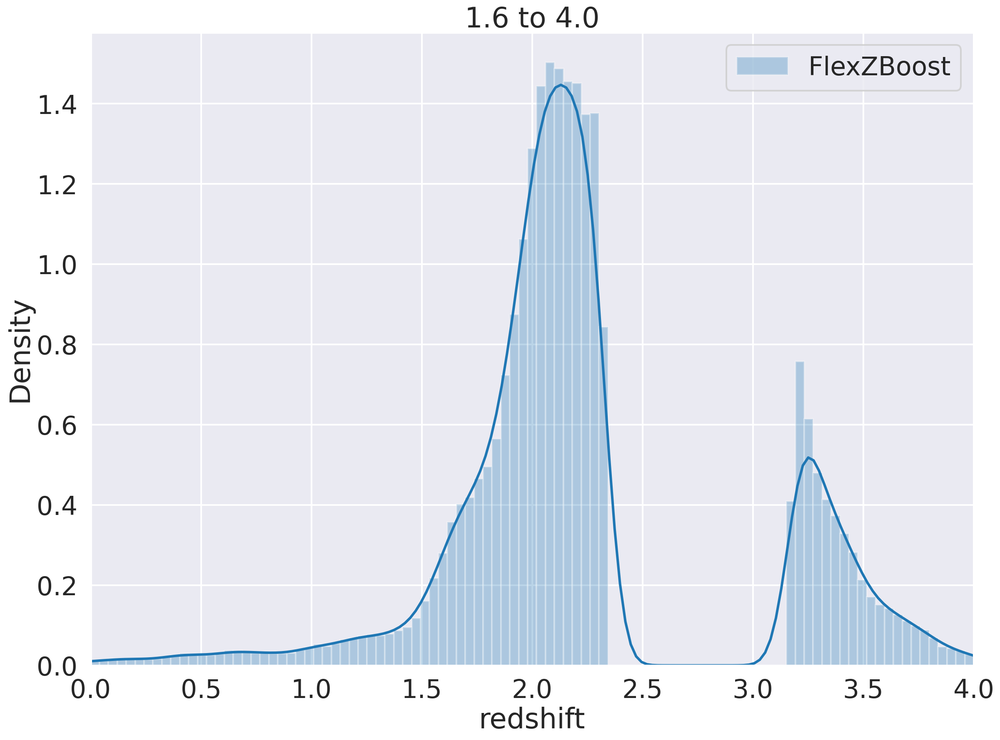

In [10]:
edges = [0.05, 0.55, 0.75, 1.15, 1.55, 3.95]
for i in range(len(edges)-1):
    plt.figure()
    for data in zip([df2],
                    ['FlexZBoost'],
                    ['redshift'],
                    ['photoz_mode']):
        df = data[0]
        errors = df[data[2]] - df[data[3]]
        outliers = np.abs(errors) > 3 * iqr(errors)
        data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])]
        print(min(data_in_bin['redshift']), max(data_in_bin['redshift']))
        sns.distplot(- data_in_bin[outliers][data[3]] + data_in_bin[outliers][data[2]] + centers[i], label=data[1], hist_kws=dict(alpha=0.3), kde_kws=dict(bw=0.1), bins=np.linspace(0 , 4, 100));
    plt.legend()
    plt.xlim((0, 4))
    plt.title('{:.1f} to {:.1f}'.format(edges[i], edges[i+1]))
    plt.xlabel('redshift')

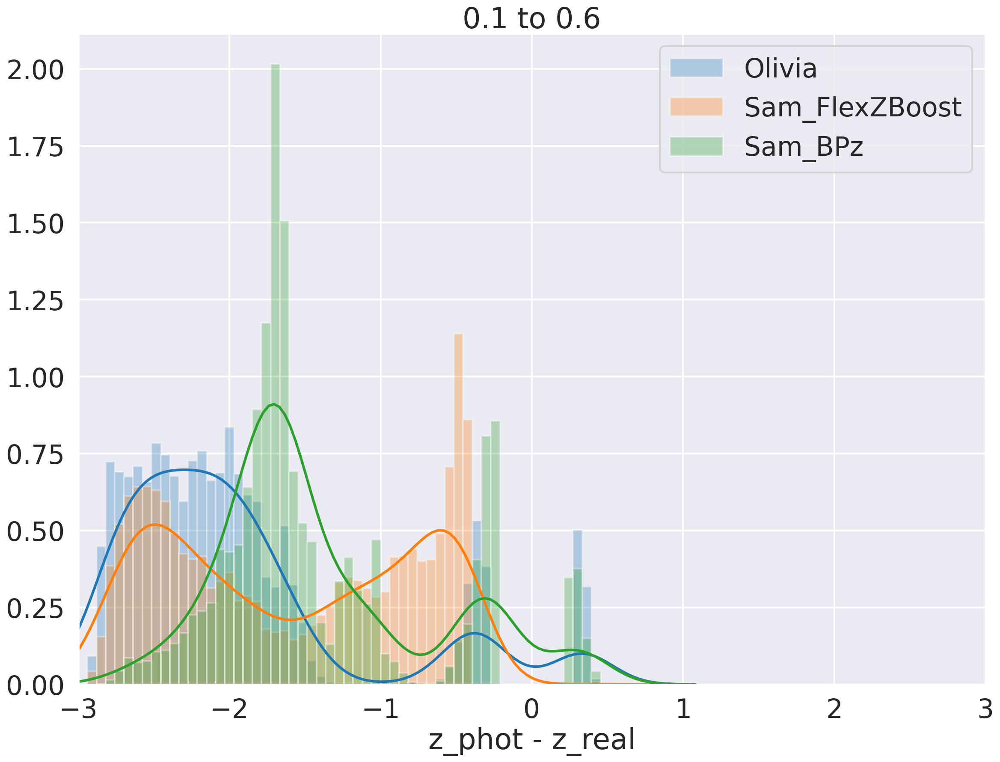

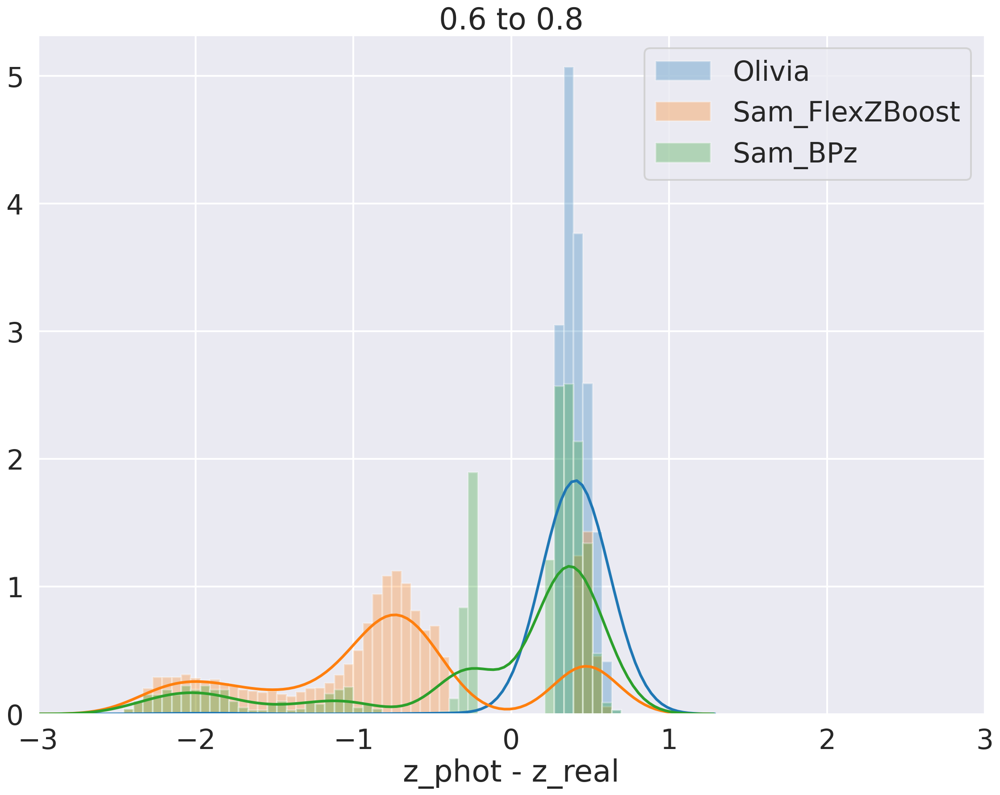

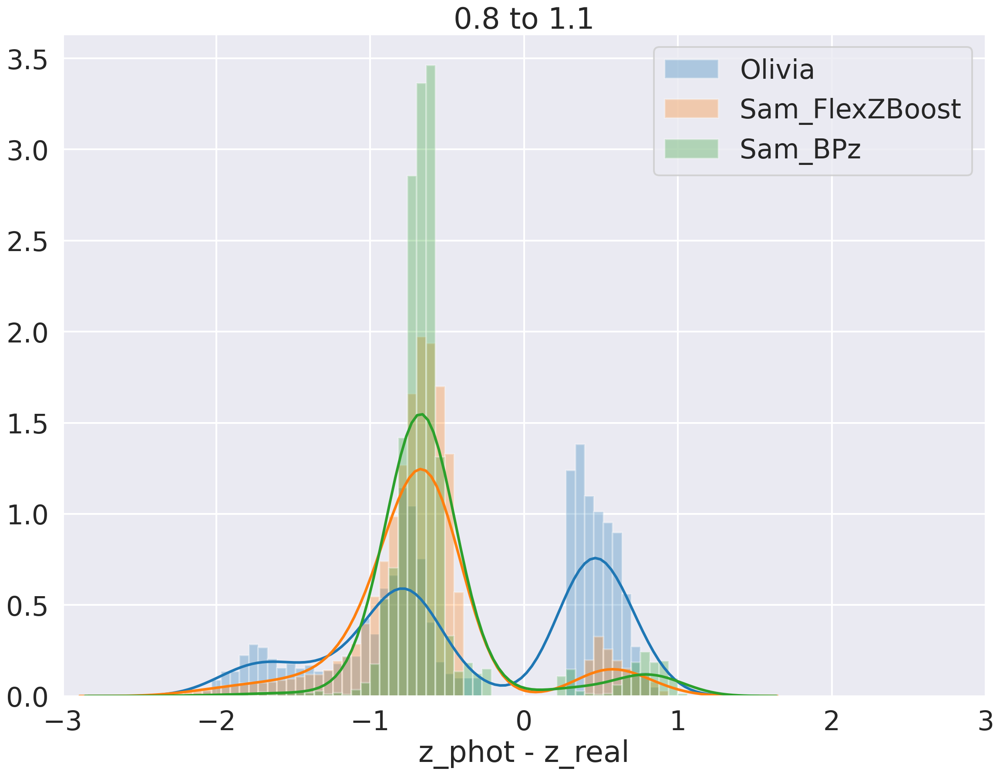

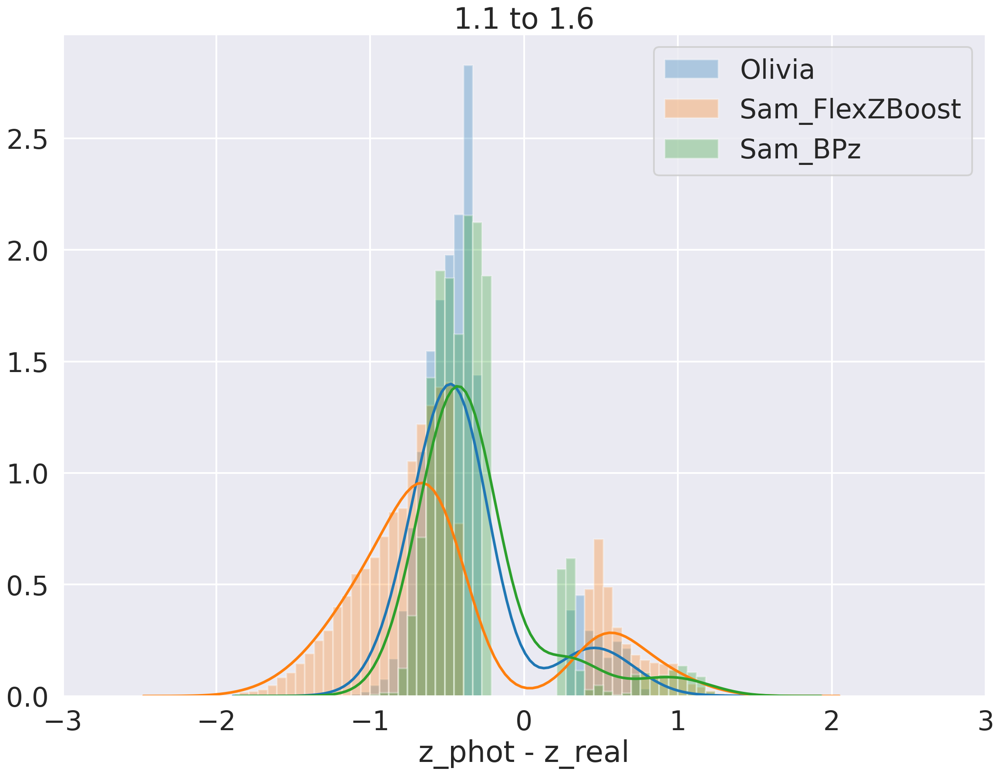

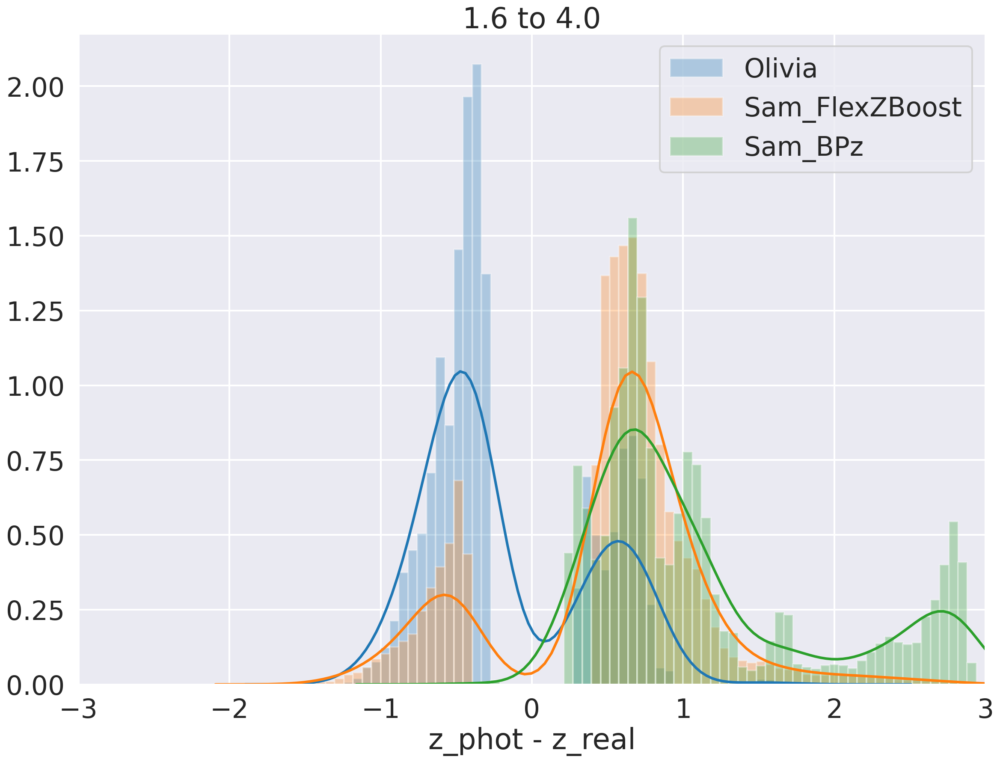

In [71]:
edges = [0.05, 0.55, 0.75, 1.15, 1.55, 3.95]
for i in range(len(edges)-1):
    plt.figure()
    for data in zip([df1, df2, bpz],
                    ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                    ['rz_real', 'redshift', 'redshift_lsst'],
                    ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
        df = data[0]
        errors = df[data[2]] - df[data[3]]
        outliers = np.abs(errors) > 3 * iqr(errors)
        data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])] 
        sns.distplot(data_in_bin[outliers][data[3]] - data_in_bin[outliers][data[2]], label=data[1], hist_kws=dict(alpha=0.3), kde_kws=dict(bw=0.2), bins=np.linspace(-3 ,3, 100));
    plt.legend()
    plt.xlim((-3, 3))
    plt.title('{:.1f} to {:.1f}'.format(edges[i], edges[i+1]))
    plt.xlabel('z_phot - z_real')

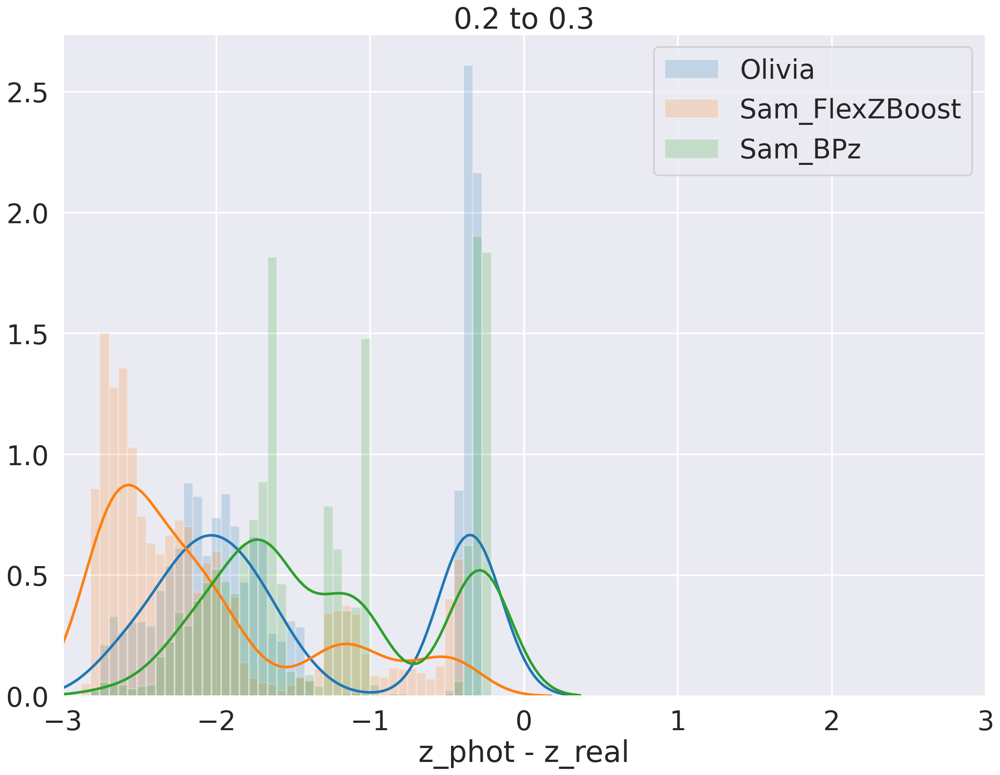

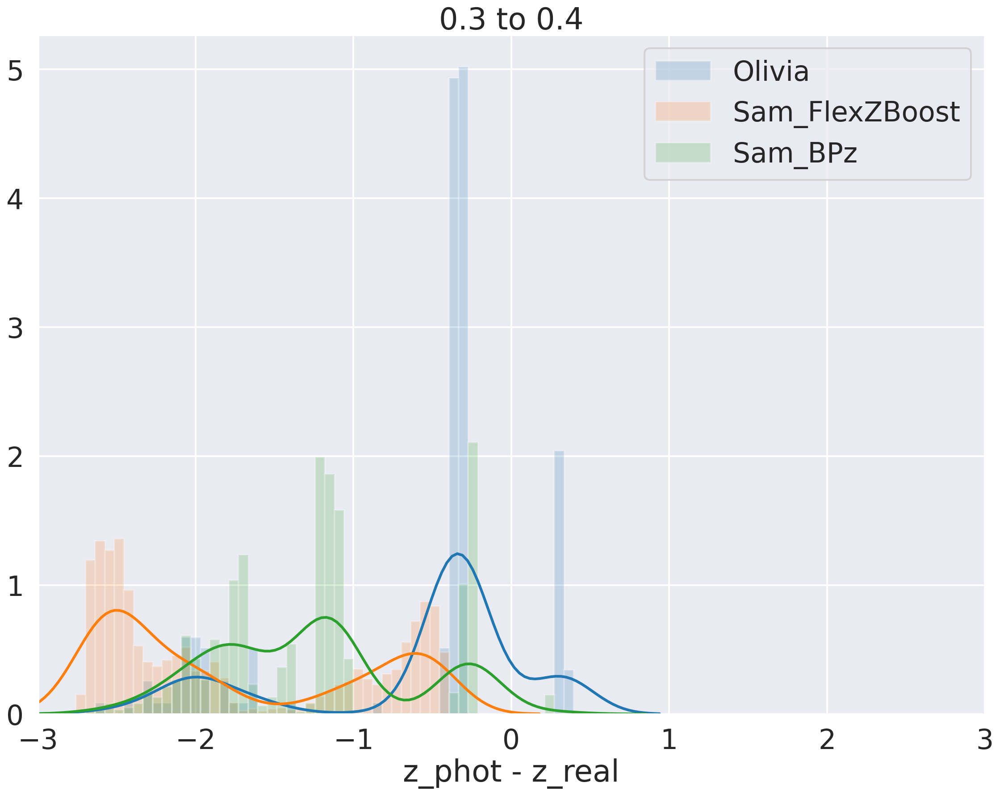

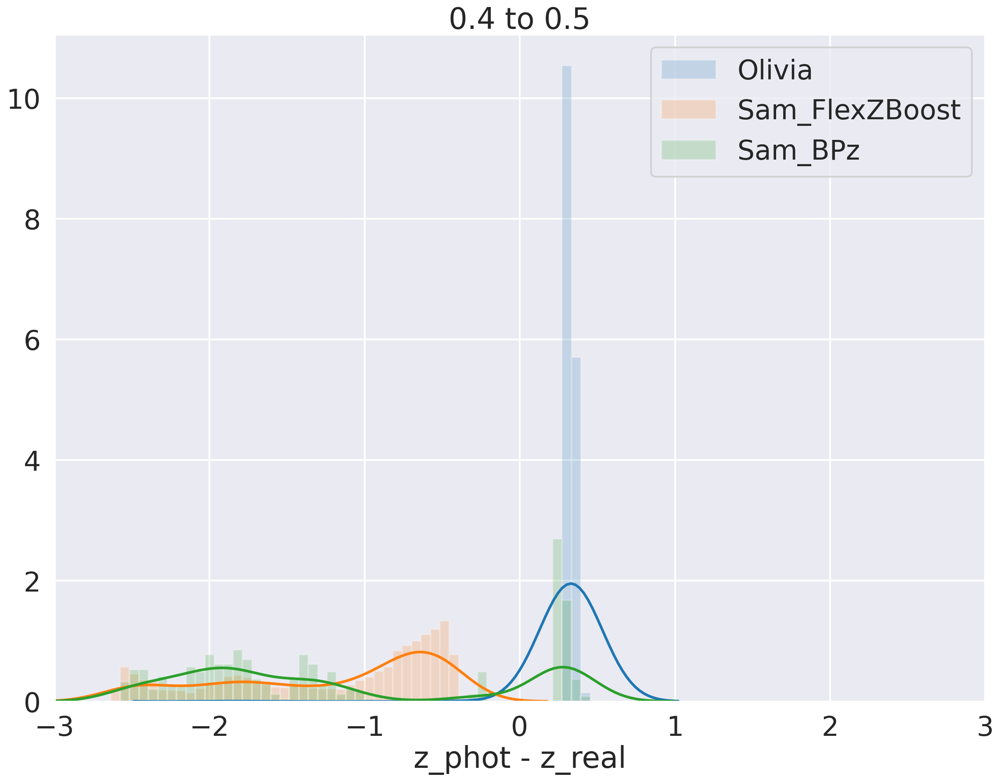

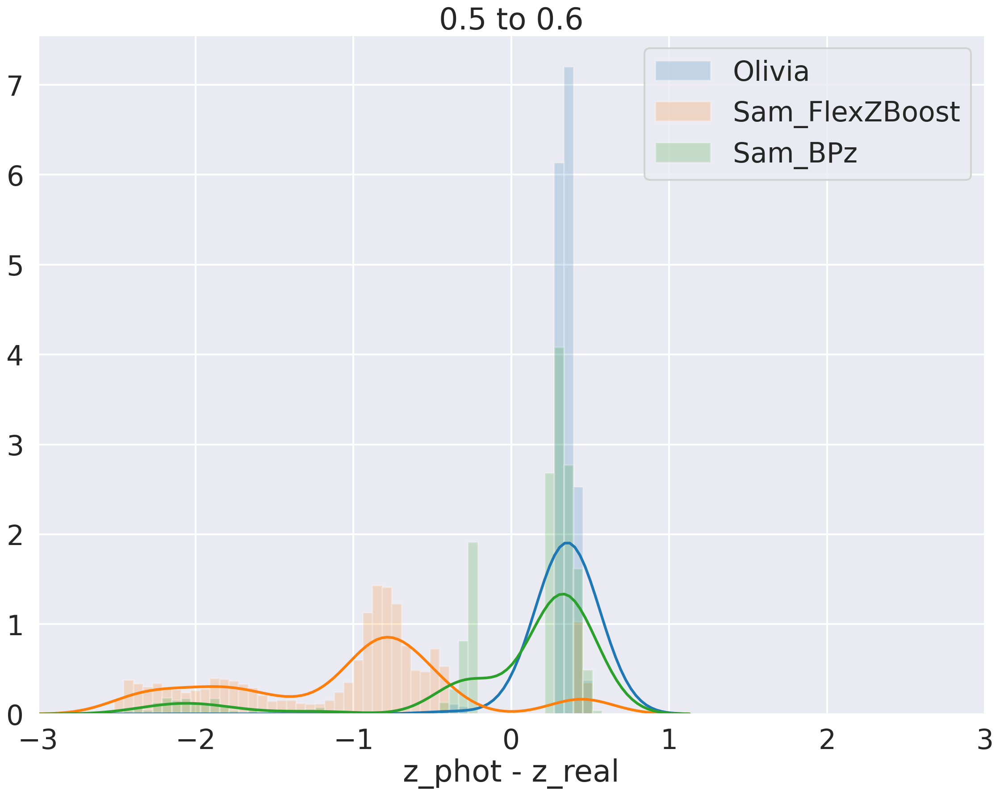

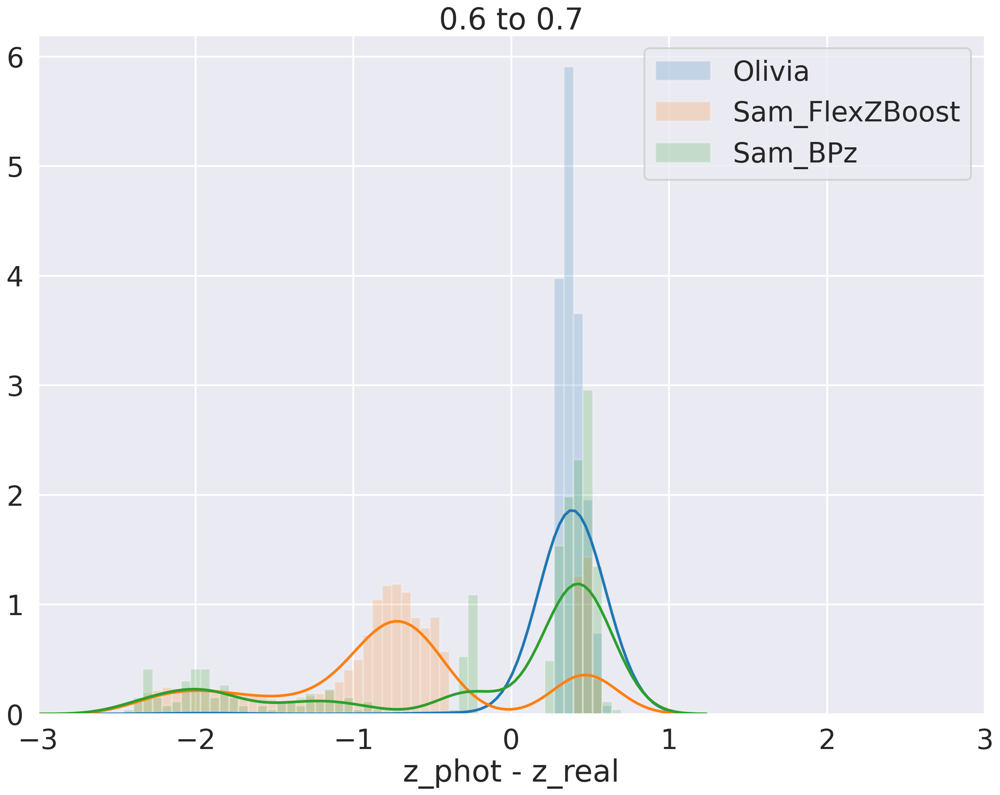

In [ ]:
edges = np.linspace(0.2, 1.2, 11)
for i in range(len(edges)-1):
    plt.figure()
    for data in zip([df1, df2, bpz],
                    ['Olivia', 'Sam_FlexZBoost', 'Sam_BPz'],
                    ['rz_real', 'redshift', 'redshift_lsst'],
                    ['photoz_mode', 'photoz_mode', 'galaxy_points_z_mode']):
        df = data[0]
        errors = df[data[2]] - df[data[3]]
        outliers = np.abs(errors) > 3 * iqr(errors)
        data_in_bin = df[np.logical_and(df[data[3]]>edges[i], df[data[3]]<edges[i+1])] 
        sns.distplot(data_in_bin[outliers][data[3]] - data_in_bin[outliers][data[2]], label=data[1], hist_kws=dict(alpha=0.2), kde_kws=dict(bw=0.2), bins=np.linspace(-3 ,3, 100));
    plt.legend()
    plt.xlim((-3, 3))
    plt.title('{:.1f} to {:.1f}'.format(edges[i], edges[i+1]))
    plt.xlabel('z_phot - z_real')